In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle 
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from xgboost import XGBClassifier

## Funciones

In [27]:
def woe_continuas_a_discretas_train(df, numeric_columns, target, min_bins=2, max_bins=10):
    """
    Transforma columnas numéricas a categorías basadas en binning óptimo por Information Value (IV)
    y luego aplica la transformación Weight of Evidence (WOE).
    """
    if not(1 < min_bins <= max_bins):
        raise(ValueError('min_bins debe ser mayor que 1 y menor o igual a max_bins'))
    
    df_transformed = df.copy()
    woe_mapping = {}
    column_bests = []
    bin_edges = {}  # ← NUEVO: Guardar los edges de los bins
    
    for col in numeric_columns:
        print(f'Procesando columna: {col}')
        best_k = 0
        best_iv = 0
        temp_woe_map = {}
        best_bin_edges = None  # ← NUEVO: Guardar los mejores edges
        
        for k in range(min_bins, max_bins+1):
            if df_transformed[col].nunique() < k:
                continue
            
            aux = df_transformed[[col, target]].copy()
    
            try:
                # Obtener los bins y sus edges
                aux['bin'], bin_edges_temp = pd.cut(
                    aux[col], 
                    bins=k, 
                    include_lowest=True, 
                    duplicates='drop',
                    retbins=True  # ← NUEVO: Obtener los edges
                )
                aux['bin'] = aux['bin'].astype(str)
            except Exception as e:
                continue
    
            pivot_df = pd.crosstab(aux['bin'], aux[target])
            for class_val in [1,0]:
                if class_val not in pivot_df.columns:
                    pivot_df[class_val] = 0
    
            pivot_df = pivot_df[[0,1]]
            epsilon = 1e-6
            pivot_df['prop_0'] = (pivot_df[0] + epsilon) / (pivot_df[0].sum() + 2*epsilon)
            pivot_df['prop_1'] = (pivot_df[1] + epsilon) / (pivot_df[1].sum() + 2*epsilon)
    
            pivot_df['WOE'] = np.log(pivot_df['prop_0']/pivot_df['prop_1'])
            pivot_df['IV'] = (pivot_df['prop_0'] - pivot_df['prop_1']) * pivot_df['WOE']
    
            current_iv = pivot_df['IV'].sum()
    
            if not np.isinf(current_iv) and not np.isnan(current_iv):
                if current_iv > best_iv:
                    best_iv = current_iv
                    best_k = k
                    temp_woe_map = pivot_df['WOE'].to_dict()
                    best_bin_edges = bin_edges_temp  # ← NUEVO: Guardar los mejores edges
        
        if best_k == 0:
            print(f"  Advertencia: No se pudo encontrar una 'best_k' válida para {col}. Columna omitida.")
            continue
        
        print(f'{col}: Best IV = {best_iv:.4f}, Best K = {best_k}')
        column_bests.append((col, best_iv, best_k))
        
        # Aplicar la transformación final con los mejores bins
        df_transformed[f'{col}_bin'] = pd.cut(
            df_transformed[col], 
            bins=best_bin_edges, 
            include_lowest=True, 
            duplicates='drop'
        ).astype(str)
        
        df_transformed[f'W_{col}'] = df_transformed[f'{col}_bin'].map(temp_woe_map)
        df_transformed[f'W_{col}'] = df_transformed[f'W_{col}'].fillna(0)
    
        woe_mapping[col] = temp_woe_map
        bin_edges[col] = best_bin_edges  # ← NUEVO: Guardar los edges
    
        df_transformed.drop(columns=[f'{col}_bin'], inplace=True)
    
    return df_transformed, woe_mapping, column_bests, bin_edges


In [28]:
def woe_continuas_a_discretas_test(df_test, woe_mapping, column_bests, bin_edges):
    """
    Aplica la transformación WOE a un DataFrame de test usando los bins y mapeos aprendidos del set de entrenamiento.
    """
    df_transformed = df_test.copy()
    
    for col, _, best_k in column_bests:
        print(f'Transformando columna: {col}')
        try:
            # Usar los MISMOS edges que en train ← CLAVE
            df_transformed[f'{col}_bin'] = pd.cut(
                df_transformed[col], 
                bins=bin_edges[col],  # ← CAMBIO: Usar los edges exactos del train
                include_lowest=True, 
                duplicates='drop'
            ).astype(str)
            
            # Mapear con WOE ya aprendido
            df_transformed[f'W_{col}'] = df_transformed[f'{col}_bin'].map(woe_mapping[col])
            
            # Llenar NaNs por si algún bin nuevo no existía en train
            df_transformed[f'W_{col}'] = df_transformed[f'W_{col}'].fillna(0)
            
            # Eliminar columna bin
            df_transformed.drop(columns=[f'{col}_bin'], inplace=True)
            
        except Exception as e:
            print(f'Error transformando {col}: {e}')
    
    return df_transformed

In [29]:


def aplicar_transformaciones(df, stats=None, es_train=True):
    df = df.copy()

    # Variables directas (no necesitan stats del train)
    df['Ratio_Debt'] = df[[f'BILL_AMT{i}' for i in range(1,7)]].sum(axis=1) / df['LIMIT_BAL']
    df['Max_Estatus_Pay'] = df[[f'PAY_{i}' for i in [0,2,3,4,5,6]]].max(axis=1)
    df['Promedio_Estatus_Pay'] = df[[f'PAY_{i}' for i in [0,2,3,4,5,6]]].mean(axis=1)
    df['Ratio_Payment'] = df[[f'PAY_AMT{i}' for i in range(1,7)]].sum(axis=1) / df['LIMIT_BAL']
    df['Count_Pay_Retrasados'] = (df[[f'PAY_{i}' for i in [0,2,3,4,5,6]]] > 0).sum(axis=1)
    df['Count_Pay_A_Tiempo'] = (df[[f'PAY_{i}' for i in [0,2,3,4,5,6]]] == -1).sum(axis=1)
    df['Total_Pay'] = df[[f'PAY_AMT{i}' for i in range(1,7)]].sum(axis=1)
    df['Total_Bill'] = df[[f'BILL_AMT{i}' for i in range(1,7)]].sum(axis=1)
    df['Pay/Bill'] = np.where(df['Total_Bill'] == 0, 0, df['Total_Pay'] / df['Total_Bill'])
    df['Pay_tendencia'] = df['PAY_AMT1'] - df['PAY_AMT6']
    df['Bill_tendencia'] = df['BILL_AMT1'] - df['BILL_AMT6']
    df['Diff_Bill_Pay'] = df['Total_Bill'] - df['Total_Pay']
    df['Diff_Bill_Pay_Tendencia'] = (df['BILL_AMT1'] - df['PAY_AMT1']) - (df['BILL_AMT6'] - df['PAY_AMT6'])

    df['Meses_Pago_Completo'] = sum([
        (df[f'PAY_AMT{i}'] >= df[f'BILL_AMT{i}']).astype(int)
        for i in range(1, 7)
    ])

    df['Meses_Deuda'] = sum([
        (df[f'PAY_AMT{i}'] <= df[f'BILL_AMT{i}']).astype(int)
        for i in range(1, 7)
    ])

    # Inicializar stats si es None
    if stats is None:
        stats = {}

    # Estadísticas y bins calculados solo en train
    if es_train:
        stats['pay_std'] = df[[f'PAY_AMT{i}' for i in range(1,7)]].std(axis=1).mean()
        stats['pay_mean'] = df[[f'PAY_AMT{i}' for i in range(1,7)]].mean(axis=1).mean()
        stats['bill_mean'] = df[[f'BILL_AMT{i}' for i in range(1,7)]].mean(axis=1).mean()

        # Calular los bins de Age_Quartile en el conjunto de entrenamiento
        # y almacenarlos en stats
        _, bins_age = pd.qcut(df['AGE'], q=4, retbins=True, duplicates='drop')
        stats['age_bins'] = bins_age
        labels_age = ['Joven', 'Adulto joven', 'Adulto', 'Mayor']
        stats['age_labels'] = labels_age
    else: # Si no es entrenamiento, asegurarse de que stats tenga lo necesario
        if 'pay_std' not in stats or 'pay_mean' not in stats or 'bill_mean' not in stats:
            raise ValueError("Las estadísticas 'pay_std', 'pay_mean', 'bill_mean' deben ser proporcionadas en 'stats' cuando 'es_train' es False.")
        if 'age_bins' not in stats or 'age_labels' not in stats:
            raise ValueError("Los bins y etiquetas de 'AGE' deben ser proporcionados en 'stats' cuando 'es_train' es False.")

    # Aplicar Age_Quartile usando los bins calculados en el entrenamiento
    # Usar pd.cut con los bins predefinidos
    df['Age_Quartile'] = pd.cut(df['AGE'], bins=stats['age_bins'], labels=stats['age_labels'], include_lowest=True, right=True).astype(str)
    # Manejar posibles NaNs si algún valor de AGE cae fuera de los bins aprendidos (poco común para qcut)
    df['Age_Quartile'] = df['Age_Quartile'].fillna('Desconocido') # O alguna otra estrategia

    # Continuar con las transformaciones que usan stats para imputación
    df['Pago_desviacion'] = df[[f'PAY_AMT{i}' for i in range(1,7)]].std(axis=1).fillna(stats['pay_std'])
    df['Pay_amount_mean'] = df[[f'PAY_AMT{i}' for i in range(1,7)]].mean(axis=1).fillna(stats['pay_mean'])
    df['Bill_amount_mean'] = df[[f'BILL_AMT{i}' for i in range(1,7)]].mean(axis=1).fillna(stats['bill_mean'])

    df['Pay_tendencia_Amplia'] = df[[f'PAY_AMT{i}' for i in range(1,4)]].mean(axis=1) - df[[f'PAY_AMT{i}' for i in range(4,7)]].mean(axis=1)
    df['Bill_tendencia_Amplia'] = df[[f'BILL_AMT{i}' for i in range(1,4)]].mean(axis=1) - df[[f'BILL_AMT{i}' for i in range(4,7)]].mean(axis=1)

    df['Diff_Bill_Pay_Tendencia_Amplia'] = (
        df[[f'BILL_AMT{i}' for i in range(1,4)]].mean(axis=1) - df[[f'PAY_AMT{i}' for i in range(1,4)]].mean(axis=1)
        -
        (df[[f'BILL_AMT{i}' for i in range(4,7)]].mean(axis=1) - df[[f'PAY_AMT{i}' for i in range(4,7)]].mean(axis=1))
    )

    # Tendencias ponderadas
    pesos = [1, 0.75, 0.6, 0.45, 0.3, 0.15]
    df['Pay_tendencia_ponderada'] = sum([
        df[f'PAY_AMT{i}'] * peso for i, peso in zip(range(1,7), pesos)
    ])
    df['Bill_tendencia_ponderada'] = sum([
        df[f'BILL_AMT{i}'] * peso for i, peso in zip(range(1,7), pesos)
    ])

    return df, stats if es_train else df

## Analisis de Datos

### Lectura de Datos

In [30]:
seed = 666
np.random.seed(seed)

In [31]:
df = pd.read_csv('datos/train_default.csv', sep = '|' )

In [32]:
pd.set_option('display.max_columns',None)
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,230000.0,2,3,1,37,0,0,0,0,0,0,228342.0,189966.0,142377.0,143828.0,143698.0,143342.0,6100.0,7000.0,5356.0,5400.0,5200.0,5500.0,0
5621,14027,50000.0,2,3,2,34,0,0,0,0,0,0,51037.0,47669.0,48940.0,50545.0,29523.0,28960.0,2100.0,2329.0,2943.0,990.0,1168.0,975.0,0
5622,23575,290000.0,2,2,1,34,0,0,0,0,-1,0,53437.0,44037.0,5441.0,7371.0,38832.0,41955.0,1274.0,1200.0,2033.0,38832.0,3900.0,188423.0,0
5623,21834,150000.0,2,2,2,26,0,0,0,0,0,0,83446.0,75067.0,64432.0,54848.0,46098.0,47352.0,3500.0,3000.0,2000.0,2000.0,2000.0,2000.0,0


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CUSTOMER_ID                 5625 non-null   int64  
 1   LIMIT_BAL                   5625 non-null   float64
 2   SEX                         5625 non-null   int64  
 3   EDUCATION                   5625 non-null   int64  
 4   MARRIAGE                    5625 non-null   int64  
 5   AGE                         5625 non-null   int64  
 6   PAY_0                       5625 non-null   int64  
 7   PAY_2                       5625 non-null   int64  
 8   PAY_3                       5625 non-null   int64  
 9   PAY_4                       5625 non-null   int64  
 10  PAY_5                       5625 non-null   int64  
 11  PAY_6                       5625 non-null   int64  
 12  BILL_AMT1                   5625 non-null   float64
 13  BILL_AMT2                   5625 

In [34]:
df.describe([0.01,0.05, 0.25, 0.5, 0.75, 0.95 ,0.99])

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000
mean,15238.895644,163935.587556,1.609956,1.838756,1.558044,35.380978,0.000711,-0.105244,-0.136889,-0.206756,-0.245867,-0.268800,49477.308622,47841.909511,4.609335e+04,41785.053867,39086.867378,37615.092622,5479.214400,6.446782e+03,5155.716622,4789.243200,4700.983644,5003.040178,0.220978
std,8559.798257,127902.220141,0.487803,0.786934,0.518728,9.144802,1.131000,1.211733,1.200299,1.158074,1.144049,1.162597,69292.868929,67238.808622,6.928598e+04,59771.019553,56487.673746,55559.215787,15342.151617,3.332234e+04,15494.010969,15631.744562,14347.984080,17544.870552,0.414942
min,2.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-11545.000000,-69777.000000,-2.032000e+04,-170000.000000,-61372.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
1%,369.240000,10000.000000,1.000000,1.000000,1.000000,22.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-132.200000,-164.840000,-1.250000e+02,-156.080000,-135.200000,-250.200000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
5%,1727.400000,20000.000000,1.000000,1.000000,1.000000,23.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7920.000000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3656.000000,3258.000000,2.904000e+03,2571.000000,1908.000000,1324.000000,1000.000000,7.880000e+02,500.000000,267.000000,216.000000,100.000000,0.000000
50%,15225.000000,130000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22872.000000,22453.000000,2.057100e+04,19561.000000,18874.000000,17934.000000,2130.000000,2.000000e+03,1831.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,22623.000000,230000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65802.000000,62147.000000,5.946500e+04,52330.000000,49366.000000,48833.000000,5000.000000,5.000000e+03,4400.000000,4000.000000,4000.000000,4000.000000,0.000000
95%,28545.000000,420000.000000,2.000000,3.000000,2.000000,53.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,192976.000000,186869.800000,1.789370e+05,165278.800000,159272.000000,153470.800000,17505.200000,1.829620e+04,17761.800000,15544.800000,16238.200000,16078.200000,1.000000


In [35]:
df.isnull().sum()

CUSTOMER_ID                   0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

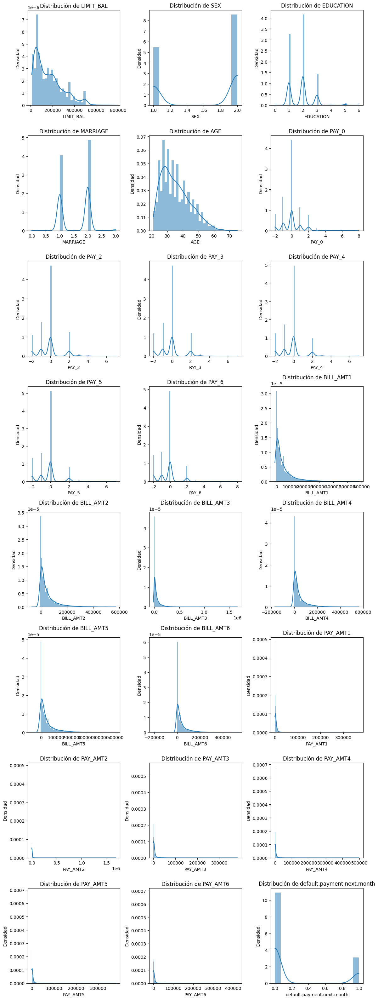

In [36]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

## Ingenieria de variables

In [37]:
X_train, X_test , y_train, y_test = train_test_split(df.drop(columns=['CUSTOMER_ID','default.payment.next.month']), 
                                                     df['default.payment.next.month'], train_size=0.7, random_state=seed)

In [38]:
df = X_train.copy()

In [39]:
df, stats = aplicar_transformaciones(df, stats=None,es_train=True)

In [40]:
df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada
1779,30000.0,1,3,2,34,2,2,2,0,0,0,24367.0,28682.0,27922.0,28632.0,29075.0,30891.0,4723.0,0.0,1173.0,1056.0,2300.0,0.0,5.652300,2,1.000000,0.308400,3,0,9252.0,169569.0,0.054562,4723.0,-6524.0,160317.0,-11247.0,0,6,Adulto joven,1778.831639,1542.000000,28261.500000,846.666667,-2542.333333,-3389.000000,6592.00,88872.25
1070,50000.0,2,3,2,23,0,0,0,0,0,0,47486.0,47963.0,33499.0,19227.0,19334.0,19735.0,1703.0,1304.0,680.0,696.0,717.0,677.0,3.744880,0,0.000000,0.115540,0,0,5777.0,187244.0,0.030853,1026.0,27751.0,181467.0,26725.0,0,6,Joven,437.623316,962.833333,31207.333333,532.333333,23550.666667,23018.333333,3718.85,120970.25
3385,20000.0,1,2,2,22,0,0,0,0,-1,-1,18462.0,16699.0,19674.0,19258.0,9546.0,12051.0,1510.0,3875.0,759.0,10000.0,19126.0,1946.0,4.784500,0,-0.333333,1.860800,0,2,37216.0,95690.0,0.388923,-436.0,6411.0,58474.0,6847.0,1,5,Joven,7164.135054,6202.666667,15948.333333,-8309.333333,4660.000000,12969.333333,15401.35,56128.20
2705,230000.0,2,2,2,27,1,2,0,0,0,0,13668.0,12647.0,13135.0,10596.0,9218.0,5068.0,0.0,1064.0,423.0,313.0,1000.0,4641.0,0.279704,2,0.500000,0.032352,2,0,7441.0,64332.0,0.115666,-4641.0,8600.0,56891.0,13241.0,0,6,Joven,1715.796890,1240.166667,10722.000000,-1489.000000,4856.000000,6345.000000,2188.80,39328.05
4025,340000.0,2,2,1,42,-1,-1,-1,-1,-1,-1,14087.0,11007.0,16971.0,10734.0,9200.0,23818.0,11013.0,17025.0,10734.0,9200.0,23818.0,46291.0,0.252403,-1,-1.000000,0.347297,0,6,118081.0,85817.0,1.375963,-35278.0,-9731.0,-32264.0,25547.0,3,3,Mayor,14122.999645,19680.166667,14302.833333,-13512.333333,-562.333333,12950.000000,48451.20,43687.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,60000.0,2,2,1,50,0,0,0,0,0,0,33290.0,32867.0,32638.0,29743.0,26909.0,24955.0,1558.0,1571.0,1344.0,877.0,875.0,3000.0,3.006700,0,0.000000,0.153750,0,0,9225.0,180402.0,0.051136,-1442.0,8335.0,171177.0,9777.0,0,6,Mayor,781.416342,1537.500000,30067.000000,-93.000000,5729.333333,5822.333333,4649.80,102723.35
70,80000.0,2,2,1,42,0,0,-2,-2,-2,-2,30900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.386250,0,-1.333333,0.000000,0,0,0.0,30900.0,0.000000,0.0,30900.0,30900.0,30900.0,5,6,Mayor,0.000000,0.000000,5150.000000,0.000000,10300.000000,10300.000000,0.00,30900.00
2878,50000.0,2,2,1,24,0,0,0,-1,0,0,20173.0,15509.0,7085.0,10358.0,8606.0,2740.0,1500.0,2008.0,10358.0,1000.0,1000.0,4438.0,1.289420,0,-0.166667,0.406080,0,1,20304.0,64471.0,0.314932,-2938.0,17433.0,44167.0,20371.0,2,4,Joven,3648.488345,3384.000000,10745.166667,2476.000000,7021.000000,4545.000000,10636.50,43709.65
1950,80000.0,1,2,2,23,0,-1,2,-1,-1,-2,25992.0,904.0,68.0,232.0,-604.0,-440.0,1000.0,0.0,1000.0,0.0,1000.0,0.0,0.326900,2,-0.500000,0.037500,1,3,3000.0,26152.0,0.114714,1000.0,26432.0,23152.0,25432.0,3,3,Joven,547.722558,500.000000,4358.666667,333.333333,9258.666667,8925.333333,1900.00,26568.00


In [41]:
X_test = aplicar_transformaciones(X_test, stats=stats, es_train=False)[0]

In [42]:
X_test

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada
3782,20000.0,2,1,2,28,0,0,0,-2,-2,-2,12031.0,13446.0,0.0,0.0,0.0,0.0,5000.0,0.0,0.0,0.0,0.0,612.0,1.273850,0,-1.000000,0.280600,0,0,5612.0,25477.0,0.220277,4388.0,12031.0,19865.0,7643.0,4,5,Joven,2006.262861,935.333333,4246.166667,1462.666667,8492.333333,7029.666667,5091.80,22115.50
4889,100000.0,2,3,2,24,1,-2,-2,-2,-1,-1,0.0,0.0,0.0,0.0,2483.0,0.0,0.0,0.0,0.0,2483.0,0.0,80.0,0.024830,1,-1.166667,0.025630,1,2,2563.0,2483.0,1.032219,-80.0,0.0,-80.0,80.0,5,4,Joven,1007.656770,427.166667,413.833333,-854.333333,-827.666667,26.666667,1129.35,744.90
1302,30000.0,1,1,2,24,0,0,0,2,0,0,28436.0,28845.0,31071.0,30248.0,30354.0,29088.0,1800.0,3300.0,0.0,1500.0,1500.0,1300.0,5.934733,2,0.333333,0.313333,1,0,9400.0,178042.0,0.052797,500.0,-652.0,168642.0,-1152.0,0,6,Joven,1057.670396,1566.666667,29673.666667,266.666667,-446.000000,-712.666667,5595.00,95793.35
313,220000.0,2,1,1,35,-1,-1,-1,-1,-1,-1,288.0,392.0,-4.0,392.0,396.0,396.0,500.0,0.0,792.0,400.0,396.0,792.0,0.008455,-1,-1.000000,0.013091,0,6,2880.0,1860.0,1.548387,-292.0,-108.0,-1020.0,184.0,5,2,Adulto,296.291748,480.000000,310.000000,-98.666667,-169.333333,-70.666667,1392.80,934.20
5138,120000.0,2,1,2,33,2,0,0,0,0,0,18653.0,19844.0,20908.0,21560.0,22214.0,22845.0,1500.0,1400.0,1000.0,1000.0,1000.0,2000.0,1.050200,2,0.333333,0.065833,1,0,7900.0,126024.0,0.062686,-500.0,-4192.0,118124.0,-3692.0,0,6,Adulto joven,402.077936,1316.666667,21004.000000,-33.333333,-2404.666667,-2371.333333,4200.00,65873.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5557,20000.0,2,2,2,23,0,0,0,0,0,0,8647.0,9734.0,10594.0,11002.0,11608.0,9186.0,1232.0,1092.0,500.0,1000.0,500.0,500.0,3.038550,0,0.000000,0.241200,0,0,4824.0,60771.0,0.079380,732.0,-539.0,55947.0,-1271.0,0,6,Joven,341.113471,804.000000,10128.500000,274.666667,-940.333333,-1215.000000,3026.00,32115.10
2379,20000.0,2,2,2,22,-1,3,2,2,0,0,18021.0,17439.0,17466.0,17846.0,18310.0,18923.0,0.0,600.0,1000.0,1000.0,1000.0,700.0,5.400250,3,1.000000,0.215000,3,1,4300.0,108005.0,0.039813,-700.0,-902.0,103705.0,-202.0,0,6,Joven,392.003401,716.666667,18000.833333,-366.666667,-717.666667,-351.000000,1905.00,57942.00
2271,50000.0,1,1,1,41,2,0,0,0,0,0,39159.0,40194.0,41209.0,42125.0,43443.0,44476.0,1669.0,1684.0,1600.0,2000.0,1753.0,1696.0,5.012120,2,0.333333,0.208040,1,0,10402.0,250606.0,0.041507,-27.0,-5317.0,240204.0,-5290.0,0,6,Adulto,139.457042,1733.666667,41767.666667,-165.333333,-3160.666667,-2995.333333,5572.30,132690.45
5140,120000.0,1,2,1,41,1,2,2,2,2,2,39606.0,40679.0,39730.0,42148.0,44509.0,45643.0,2000.0,0.0,3400.0,3200.0,2000.0,2000.0,2.102625,2,1.833333,0.105000,6,0,12600.0,252315.0,0.049938,0.0,-6037.0,239715.0,-6037.0,0,6,Adulto,1211.610498,2100.000000,42052.500000,-600.000000,-4095.000000,-3495.000000,6380.00,133119.00


In [43]:
df.isna().sum()

LIMIT_BAL                         0
SEX                               0
EDUCATION                         0
MARRIAGE                          0
AGE                               0
PAY_0                             0
PAY_2                             0
PAY_3                             0
PAY_4                             0
PAY_5                             0
PAY_6                             0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
Ratio_Debt                        0
Max_Estatus_Pay                   0
Promedio_Estatus_Pay              0
Ratio_Payment                     0
Count_Pay_Retrasados        

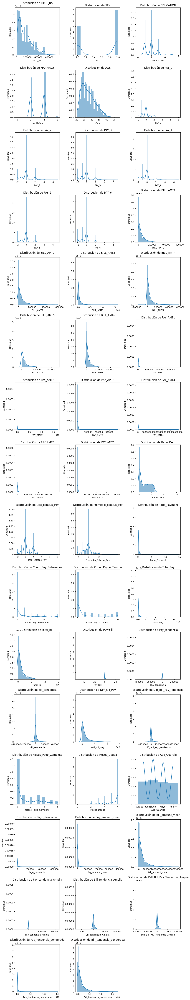

In [44]:
aux = df
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

In [45]:
lst_column_log = ['LIMIT_BAL','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2',
                  'PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Ratio_Debt','Ratio_Payment','Total_Pay','Total_Bill',
                  'Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Pay_tendencia_ponderada','Bill_tendencia_ponderada','Pago_desviacion']

In [46]:
df.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'Ratio_Debt', 'Max_Estatus_Pay', 'Promedio_Estatus_Pay',
       'Ratio_Payment', 'Count_Pay_Retrasados', 'Count_Pay_A_Tiempo',
       'Total_Pay', 'Total_Bill', 'Pay/Bill', 'Pay_tendencia',
       'Bill_tendencia', 'Diff_Bill_Pay', 'Diff_Bill_Pay_Tendencia',
       'Meses_Pago_Completo', 'Meses_Deuda', 'Age_Quartile', 'Pago_desviacion',
       'Pay_amount_mean', 'Bill_amount_mean', 'Pay_tendencia_Amplia',
       'Bill_tendencia_Amplia', 'Diff_Bill_Pay_Tendencia_Amplia',
       'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada'],
      dtype='object')

In [47]:
lst_column_log

['LIMIT_BAL',
 'AGE',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'Ratio_Debt',
 'Ratio_Payment',
 'Total_Pay',
 'Total_Bill',
 'Pay_amount_mean',
 'Bill_amount_mean',
 'Diff_Bill_Pay',
 'Pay_tendencia_ponderada',
 'Bill_tendencia_ponderada',
 'Pago_desviacion']

In [48]:
for col in lst_column_log:
    offset = abs(df[col].min()) + 1
    df[f'{col}_log'] = np.log1p(df[col] + offset)
    X_test[f'{col}_log'] = np.log1p(X_test[col] + offset)

/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inp

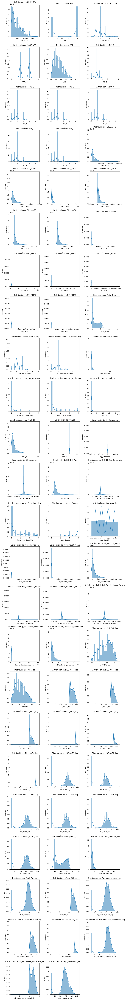

In [49]:
aux = df
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

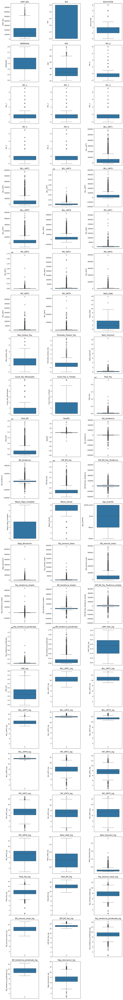

In [50]:
aux = df
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i) 
    sns.boxplot(y=df[var])  
    plt.title(var)  
plt.tight_layout()  
plt.show()


In [51]:
pd.set_option('display.max_rows', None)
df.isnull().sum()

LIMIT_BAL                         0
SEX                               0
EDUCATION                         0
MARRIAGE                          0
AGE                               0
PAY_0                             0
PAY_2                             0
PAY_3                             0
PAY_4                             0
PAY_5                             0
PAY_6                             0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
Ratio_Debt                        0
Max_Estatus_Pay                   0
Promedio_Estatus_Pay              0
Ratio_Payment                     0
Count_Pay_Retrasados        

In [52]:
pd.reset_option('display.max_rows')

In [53]:
df.describe([0.01,0.05, 0.25, 0.5, 0.75, 0.95 ,0.99])

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
count,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3.937000e+03,3937.000000,3937.000000,3937.000000,3937.000000,3.937000e+03,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3.937000e+03,3.937000e+03,3937.000000,3937.000000,3937.000000,3.937000e+03,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3.937000e+03,3.937000e+03,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000,3937.000000
mean,164561.259843,1.609093,1.845568,1.543307,35.533401,0.004826,-0.100838,-0.130810,-0.210820,-0.236474,-0.265177,50106.019812,48254.733807,4.646125e+04,41932.667513,39134.098044,37647.882144,5292.812802,6.623829e+03,5329.066040,4740.140716,4917.311151,4987.320803,2.265845,0.457709,-0.156549,0.238950,0.860554,1.138938,3.189048e+04,2.635366e+05,0.360794,305.491999,12458.137668,2.316462e+05,12152.645669,1.445263,5.145288,6015.236786,5315.080052,43922.774532,866.978325,8702.450597,7835.472272,1.781448e+04,1.504309e+05,11.769539,4.057849,10.548532,10.741191,10.774097,12.231920,11.411623,12.113132,6.748925,6.630658,6.525695,6.211781,6.180418,6.094086,1.468120,0.797909,9.259996,12.279388,7.555296,10.488148,13.187590,8.714387,11.455999,7.189082
std,128436.409618,0.488016,0.792191,0.519651,9.183123,1.145523,1.223600,1.207997,1.150183,1.133476,1.148872,69905.464032,67632.197976,7.125190e+04,59749.040379,56138.450194,55258.857793,14310.904883,3.749537e+04,16169.492533,15356.788499,15427.214441,16979.435011,2.078880,1.354683,0.988810,0.375170,1.593339,1.927088,6.695609e+04,3.550226e+05,1.284439,19152.180019,44677.111183,3.381658e+05,51069.353571,1.857914,1.282197,18484.865836,11159.348208,59170.428779,14958.086780,31350.219348,34104.155168,4.062661e+04,2.032055e+05,0.820779,0.151782,0.966501,0.819759,0.778011,0.292267,0.452183,0.297347,2.985006,3.061426,3.032027,3.126926,3.173800,3.247008,0.438083,0.116549,2.248495,0.907319,1.931147,0.901895,0.471895,2.140513,1.101722,2.098471
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-11545.000000,-18088.000000,-2.032000e+04,-170000.000000,-61372.000000,-150953.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,-0.509530,-2.000000,-2.000000,0.000000,0.000000,0.000000,0.000000e+00,-6.538200e+04,-49.888889,-402466.000000,-377092.000000,-3.644930e+05,-408587.000000,0.000000,0.000000,0.000000,0.000000,-10897.000000,-165343.333333,-267860.333333,-372591.333333,0.000000e+00,-1.869425e+04,9.903588,3.784190,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.69

### Outiliers

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3937 entries, 1779 to 1922
Data columns (total 71 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LIMIT_BAL                       3937 non-null   float64
 1   SEX                             3937 non-null   int64  
 2   EDUCATION                       3937 non-null   int64  
 3   MARRIAGE                        3937 non-null   int64  
 4   AGE                             3937 non-null   int64  
 5   PAY_0                           3937 non-null   int64  
 6   PAY_2                           3937 non-null   int64  
 7   PAY_3                           3937 non-null   int64  
 8   PAY_4                           3937 non-null   int64  
 9   PAY_5                           3937 non-null   int64  
 10  PAY_6                           3937 non-null   int64  
 11  BILL_AMT1                       3937 non-null   float64
 12  BILL_AMT2                       3937

In [55]:
lst_out_upper = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','Pago_desviacion',
           'PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Promedio_Estatus_Pay','Ratio_Payment','Total_Pay', 'Total_Bill',
                 'Pay/Bill','Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Ratio_Payment_log','Pay_tendencia_ponderada','Bill_tendencia_ponderada']
lst_out_both = ['Pay/Bill','Pay_tendencia','Bill_tendencia','Pay_tendencia_Amplia','Bill_tendencia_Amplia','Diff_Bill_Pay_Tendencia',
                'Diff_Bill_Pay_Tendencia_Amplia','BILL_AMT1_log','BILL_AMT2_log','BILL_AMT3_log','BILL_AMT4_log','BILL_AMT5_log','Pago_desviacion_log',
                'BILL_AMT6_log','PAY_AMT2_log','PAY_AMT3_log','PAY_AMT4_log','PAY_AMT5_log','Total_Pay_log','Diff_Bill_Pay_log','Pay_tendencia_ponderada_log']
lst_out_lower = ['Total_Bill_log','Bill_amount_mean_log','Bill_tendencia_ponderada_log']

In [56]:
for v in lst_out_upper: # Debido a la gran cantidad de outliers vistos en los boxplot, aplicamos winsorize parta no perder tantos datos
    df[v] = winsorize(df[v], limits = [0, 0.1])

for v in lst_out_both:
    df[v] = winsorize(df[v], limits = [0.05, 0.05])

for v in lst_out_lower:
    df[v] = winsorize(df[v], limits = [0.1, 0])


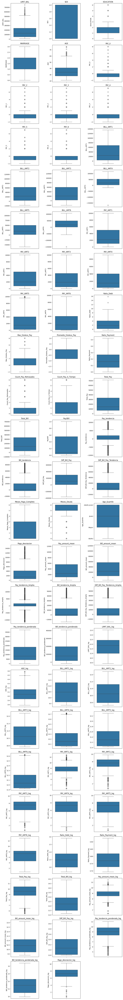

In [57]:
aux = df
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.boxplot(y=df[var])  
    plt.title(var)  
plt.tight_layout()  
plt.show()

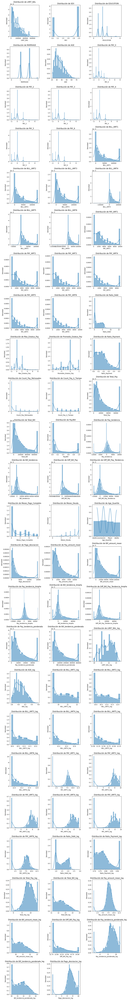

In [58]:
aux = df
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

### Codificacion

In [59]:
df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
1779,30000.0,1,3,2,34,2,2,2,0,0,0,24367.0,28682.0,27922.0,28632.0,29075.0,30891.0,4723.0,0.0,1173.0,1056.0,2300.0,0.0,5.652300,2,1.000000,0.308400,3,0,9252.0,169569.0,0.054562,4723.0,-6524.0,160317.0,-11247.0,0,6,Adulto joven,1778.831639,1542.000000,28261.500000,846.666667,-2542.333333,-3389.000000,6592.00,88872.25,10.596685,4.043051,10.488882,10.753040,10.784027,12.199219,11.412541,12.110915,8.460623,0.693147,7.069023,6.964136,7.741534,0.693147,2.099468,0.836555,9.132811,12.367141,7.342132,10.575424,13.170795,8.793915,11.585883,7.484836
1070,50000.0,2,3,2,23,0,0,0,0,0,0,47486.0,47963.0,33499.0,19227.0,19334.0,19735.0,1703.0,1304.0,680.0,696.0,717.0,677.0,3.744880,0,0.000000,0.115540,0,0,5777.0,187244.0,0.030853,1026.0,27751.0,181467.0,26725.0,0,6,Joven,437.623316,962.833333,31207.333333,532.333333,23550.666667,23018.333333,3718.85,120970.25,11.002133,3.828641,10.985852,11.098213,10.893419,12.150713,11.298593,12.047604,7.441320,7.174724,6.525030,6.548219,6.577861,6.520621,1.833287,0.749310,8.661986,12.439673,6.871955,10.647953,13.210305,8.221707,11.847013,6.085918
3385,20000.0,1,2,2,22,0,0,0,0,-1,-1,18462.0,16699.0,19674.0,19258.0,9546.0,12051.0,1510.0,3875.0,759.0,9120.0,10000.0,1946.0,4.784500,0,-0.333333,0.520922,0,2,37216.0,95690.0,0.388923,-436.0,6411.0,58474.0,6847.0,1,5,Joven,7164.135054,6202.666667,15948.333333,-8309.333333,4660.000000,12969.333333,15401.35,56128.20,10.309019,3.806662,10.309253,10.457057,10.596535,12.150877,11.169308,12.001542,7.321189,8.262817,6.634633,9.210540,9.728420,7.574558,1.987056,0.924625,10.524548,11.989619,8.733057,10.197922,12.955054,9.642340,11.222900,8.877122
2705,230000.0,2,2,2,27,1,2,0,0,0,0,13668.0,12647.0,13135.0,10596.0,9218.0,5068.0,0.0,1064.0,423.0,313.0,1000.0,4641.0,0.279704,2,0.500000,0.032352,2,0,7441.0,64332.0,0.115666,-4641.0,8600.0,56891.0,13241.0,0,6,Joven,1715.796890,1240.166667,10722.000000,-1489.000000,4856.000000,6345.000000,2188.80,39328.05,12.388403,3.912023,10.135194,10.333222,10.418016,12.104029,11.164672,11.957759,0.693147,6.971669,6.052089,5.752573,6.909753,8.443116,1.025767,0.709194,8.915029,11.773103,7.124612,9.981420,12.951305,7.692022,10.968617,7.448798
4025,340000.0,2,2,1,42,-1,-1,-1,-1,-1,-1,14087.0,11007.0,16971.0,10734.0,9200.0,23818.0,10000.0,10043.0,10000.0,9120.0,10000.0,9635.0,0.252403,-1,-1.000000,0.347297,0,6,71378.0,85817.0,1.000000,-10000.0,-9731.0,-32264.0,25547.0,3,3,Mayor,14122.999645,11896.333333,14302.833333,-11426.000000,-562.333333,12950.000000,37425.35,43687.85,12.765694,4.174387,10.151675,10.278390,10.526561,12.104793,11.164417,12.071243,9.307013,9.742556,9.281358,9.127176,9.728420,10.742746,1.015931,0.853264,11.673879,11.926365,9.887468,10.134672,12.797981,10.788354,11.041066,9.555702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993

In [60]:
df['Age_Quartile'].unique()

array(['Adulto joven', 'Joven', 'Mayor', 'Adulto'], dtype=object)

In [61]:
df = pd.get_dummies(df, columns = ['EDUCATION'],prefix='EDUCATION') # Codificamos las variables para el modelo
df = pd.get_dummies(df, columns = ['MARRIAGE'],prefix='MARRIAGE')
df = pd.get_dummies(df, columns = ['SEX'],prefix='SEX')
mapeo_Age = {'Joven':1, 'Adulto joven' :2, 'Adulto':3, 'Mayor':4}
df['Age_Quartile'] = df['Age_Quartile'].map(mapeo_Age)
X_test = pd.get_dummies(X_test, columns = ['EDUCATION'],prefix='EDUCATION') # Codificamos las variables para el modelo
X_test = pd.get_dummies(X_test, columns = ['MARRIAGE'],prefix='MARRIAGE')
X_test = pd.get_dummies(X_test, columns = ['SEX'],prefix='SEX')
X_test['Age_Quartile'] = X_test['Age_Quartile'].map(mapeo_Age)

In [62]:
df

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
1779,30000.0,34,2,2,2,0,0,0,24367.0,28682.0,27922.0,28632.0,29075.0,30891.0,4723.0,0.0,1173.0,1056.0,2300.0,0.0,5.652300,2,1.000000,0.308400,3,0,9252.0,169569.0,0.054562,4723.0,-6524.0,160317.0,-11247.0,0,6,2,1778.831639,1542.000000,28261.500000,846.666667,-2542.333333,-3389.000000,6592.00,88872.25,10.596685,4.043051,10.488882,10.753040,10.784027,12.199219,11.412541,12.110915,8.460623,0.693147,7.069023,6.964136,7.741534,0.693147,2.099468,0.836555,9.132811,12.367141,7.342132,10.575424,13.170795,8.793915,11.585883,7.484836,False,False,False,True,False,False,False,False,False,True,False,True,False
1070,50000.0,23,0,0,0,0,0,0,47486.0,47963.0,33499.0,19227.0,19334.0,19735.0,1703.0,1304.0,680.0,696.0,717.0,677.0,3.744880,0,0.000000,0.115540,0,0,5777.0,187244.0,0.030853,1026.0,27751.0,181467.0,26725.0,0,6,1,437.623316,962.833333,31207.333333,532.333333,23550.666667,23018.333333,3718.85,120970.25,11.002133,3.828641,10.985852,11.098213,10.893419,12.150713,11.298593,12.047604,7.441320,7.174724,6.525030,6.548219,6.577861,6.520621,1.833287,0.749310,8.661986,12.439673,6.871955,10.647953,13.210305,8.221707,11.847013,6.085918,False,False,False,True,False,False,False,False,False,True,False,False,True
3385,20000.0,22,0,0,0,0,-1,-1,18462.0,16699.0,19674.0,19258.0,9546.0,12051.0,1510.0,3875.0,759.0,9120.0,10000.0,1946.0,4.784500,0,-0.333333,0.520922,0,2,37216.0,95690.0,0.388923,-436.0,6411.0,58474.0,6847.0,1,5,1,7164.135054,6202.666667,15948.333333,-8309.333333,4660.000000,12969.333333,15401.35,56128.20,10.309019,3.806662,10.309253,10.457057,10.596535,12.150877,11.169308,12.001542,7.321189,8.262817,6.634633,9.210540,9.728420,7.574558,1.987056,0.924625,10.524548,11.989619,8.733057,10.197922,12.955054,9.642340,11.222900,8.877122,False,False,True,False,False,False,False,False,False,True,False,True,False
2705,230000.0,27,1,2,0,0,0,0,13668.0,12647.0,13135.0,10596.0,9218.0,5068.0,0.0,1064.0,423.0,313.0,1000.0,4641.0,0.279704,2,0.500000,0.032352,2,0,7441.0,64332.0,0.115666,-4641.0,8600.0,56891.0,13241.0,0,6,1,1715.796890,1240.166667,10722.000000,-1489.000000,4856.000000,6345.000000,2188.80,39328.05,12.388403,3.912023,10.135194,10.333222,10.418016,12.104029,11.164672,11.957759,0.693147,6.971669,6.052089,5.752573,6.909753,8.443116,1.025767,0.709194,8.915029,11.773103,7.124612,9.981420,12.951305,7.692022,10.968617,7.448798,False,False,True,False,False,False,False,False,False,True,False,False,True
4025,340000.0,42,-1,-1,-1,-1,-1,-1,14087.0,11007.0,16971.0,10734.0,9200.0,23818.0,10000.0,10043.0,10000.0,9120.0,10000.0,9635.0,0.252403,-1,-1.000000,0.347297,0,6,71378.0,85817.0,1.000000,-10000.0,-9731.0,-32264.0,25547.0,3,3,4,14122.999645,11896.333333,14302.833333,-11426.000000,-562.333333,12950.000000,37425.35,43687.85,12.765694,4.174387,10.151675,10.278390,10.526561,12.104793,11.164417,12.071243,9.307013,9.742556,9.281358,9.127176,9.728420,10.742746,1.015931,0.853264,11.673879,

In [63]:
X_test

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
3782,20000.0,28,0,0,0,-2,-2,-2,12031.0,13446.0,0.0,0.0,0.0,0.0,5000.0,0.0,0.0,0.0,0.0,612.0,1.273850,0,-1.000000,0.280600,0,0,5612.0,25477.0,0.220277,4388.0,12031.0,19865.0,7643.0,4,5,1,2006.262861,935.333333,4246.166667,1462.666667,8492.333333,7029.666667,5091.80,22115.50,10.309019,3.931826,10.068069,10.358885,9.919459,12.043565,11.024742,11.924737,8.517593,0.693147,0.693147,0.693147,0.693147,6.419995,1.330618,0.824439,8.633019,11.417086,6.843039,9.625437,12.859335,8.535779,10.616725,7.605025,False,True,False,False,False,False,False,False,False,True,False,False,True
4889,100000.0,24,1,-2,-2,-2,-1,-1,0.0,0.0,0.0,0.0,2483.0,0.0,0.0,0.0,0.0,2483.0,0.0,80.0,0.024830,1,-1.166667,0.025630,1,2,2563.0,2483.0,1.032219,-80.0,0.0,-80.0,80.0,5,4,1,1007.656770,427.166667,413.833333,-854.333333,-827.666667,26.666667,1129.35,744.90,11.608254,3.850148,9.354181,9.803115,9.919459,12.043565,11.064401,11.924737,0.693147,0.693147,0.693147,7.818028,0.693147,4.406719,0.929941,0.705881,7.849714,11.125305,6.061845,9.333693,12.806049,7.031167,9.875147,6.917366,False,False,False,True,False,False,False,False,False,True,False,False,True
1302,30000.0,24,0,0,0,2,0,0,28436.0,28845.0,31071.0,30248.0,30354.0,29088.0,1800.0,3300.0,0.0,1500.0,1500.0,1300.0,5.934733,2,0.333333,0.313333,1,0,9400.0,178042.0,0.052797,500.0,-652.0,168642.0,-1152.0,0,6,1,1057.670396,1566.666667,29673.666667,266.666667,-446.000000,-712.666667,5595.00,95793.35,10.596685,3.850148,10.596210,10.756519,10.847257,12.207322,11.426583,12.100951,7.496652,8.102284,0.693147,7.314553,7.314553,7.171657,2.133487,0.838689,9.148678,12.402568,7.357981,10.610850,13.186534,8.629986,11.648239,6.965713,False,True,False,False,False,False,False,False,False,True,False,True,False
313,220000.0,35,-1,-1,-1,-1,-1,-1,288.0,392.0,-4.0,392.0,396.0,396.0,500.0,0.0,792.0,400.0,396.0,792.0,0.008455,-1,-1.000000,0.013091,0,6,2880.0,1860.0,1.548387,-292.0,-108.0,-1020.0,184.0,5,2,3,296.291748,480.000000,310.000000,-98.666667,-169.333333,-70.666667,1392.80,934.20,12.345843,4.060443,9.378817,9.824553,9.919262,12.045869,11.031173,11.927357,6.218600,0.693147,6.677083,5.996452,5.986452,6.677083,0.923459,0.699671,7.966240,11.116083,6.177944,9.324472,12.803466,7.240506,9.884837,5.698072,False,True,False,False,False,False,False,False,True,False,False,False,True
5138,120000.0,33,2,0,0,0,0,0,18653.0,19844.0,20908.0,21560.0,22214.0,22845.0,1500.0,1400.0,1000.0,1000.0,1000.0,2000.0,1.050200,2,0.333333,0.065833,1,0,7900.0,126024.0,0.062686,-500.0,-4192.0,118124.0,-3692.0,0,6,2,402.077936,1316.666667,21004.000000,-33.333333,-2404.666667,-2371.333333,4200.00,65873.75,11.775305,4.025352,10.315597,10.543603,10.626921,12.162967,11.333655,12.065660,7.314553,7.245655,6.909753,6.909753,6.909753,7.601902,1.269685,0.725534,8.974871,12.162163,7.184376,10.370455,13.086983,8.343316,11.345335,6.001608,False,True,False,False,False,False,False,False,False,True,False,

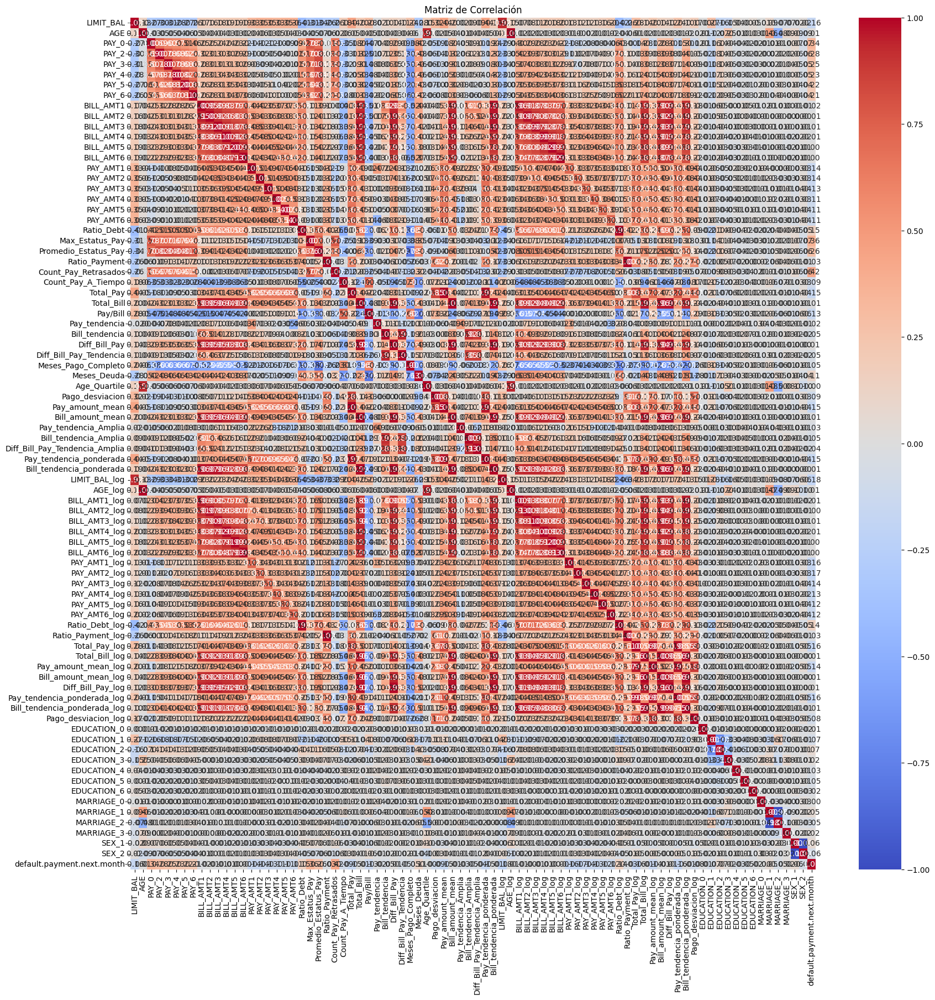

In [64]:
df_corr = df.copy()
df_corr['default.payment.next.month'] = y_train
correlation_matrix = df_corr.corr()
target_correlation = correlation_matrix["default.payment.next.month"].sort_values(ascending=False)
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

In [65]:
df_corr['default.payment.next.month'].value_counts()/len(df)

default.payment.next.month
0    0.775718
1    0.224282
Name: count, dtype: float64

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3937 entries, 1779 to 1922
Data columns (total 81 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   LIMIT_BAL                       3937 non-null   float64
 1   AGE                             3937 non-null   int64  
 2   PAY_0                           3937 non-null   int64  
 3   PAY_2                           3937 non-null   int64  
 4   PAY_3                           3937 non-null   int64  
 5   PAY_4                           3937 non-null   int64  
 6   PAY_5                           3937 non-null   int64  
 7   PAY_6                           3937 non-null   int64  
 8   BILL_AMT1                       3937 non-null   float64
 9   BILL_AMT2                       3937 non-null   float64
 10  BILL_AMT3                       3937 non-null   float64
 11  BILL_AMT4                       3937 non-null   float64
 12  BILL_AMT5                       3937

In [67]:
numeric_columns = df.select_dtypes(include = ['float64']).columns

In [68]:
numeric_columns

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Ratio_Payment', 'Total_Pay', 'Total_Bill',
       'Pay/Bill', 'Pay_tendencia', 'Bill_tendencia', 'Diff_Bill_Pay',
       'Diff_Bill_Pay_Tendencia', 'Pago_desviacion', 'Pay_amount_mean',
       'Bill_amount_mean', 'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia_Amplia', 'Pay_tendencia_ponderada',
       'Bill_tendencia_ponderada', 'LIMIT_BAL_log', 'AGE_log', 'BILL_AMT1_log',
       'BILL_AMT2_log', 'BILL_AMT3_log', 'BILL_AMT4_log', 'BILL_AMT5_log',
       'BILL_AMT6_log', 'PAY_AMT1_log', 'PAY_AMT2_log', 'PAY_AMT3_log',
       'PAY_AMT4_log', 'PAY_AMT5_log', 'PAY_AMT6_log', 'Ratio_Debt_log',
       'Ratio_Payment_log', 'Total_Pay_log', 'Total_Bill_log',
       'Pay_amount_mean_log', 'Bill_amount_mean_log', 'Diff_Bill_Pay_log',
  

In [69]:
len(numeric_columns)

55

In [70]:
numeric_columns

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Ratio_Payment', 'Total_Pay', 'Total_Bill',
       'Pay/Bill', 'Pay_tendencia', 'Bill_tendencia', 'Diff_Bill_Pay',
       'Diff_Bill_Pay_Tendencia', 'Pago_desviacion', 'Pay_amount_mean',
       'Bill_amount_mean', 'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia_Amplia', 'Pay_tendencia_ponderada',
       'Bill_tendencia_ponderada', 'LIMIT_BAL_log', 'AGE_log', 'BILL_AMT1_log',
       'BILL_AMT2_log', 'BILL_AMT3_log', 'BILL_AMT4_log', 'BILL_AMT5_log',
       'BILL_AMT6_log', 'PAY_AMT1_log', 'PAY_AMT2_log', 'PAY_AMT3_log',
       'PAY_AMT4_log', 'PAY_AMT5_log', 'PAY_AMT6_log', 'Ratio_Debt_log',
       'Ratio_Payment_log', 'Total_Pay_log', 'Total_Bill_log',
       'Pay_amount_mean_log', 'Bill_amount_mean_log', 'Diff_Bill_Pay_log',
  

In [71]:
categorical_columns = df.select_dtypes(exclude = ['float64']).columns

In [72]:
categorical_columns

Index(['AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6',
       'Max_Estatus_Pay', 'Count_Pay_Retrasados', 'Count_Pay_A_Tiempo',
       'Meses_Pago_Completo', 'Meses_Deuda', 'Age_Quartile', 'EDUCATION_0',
       'EDUCATION_1', 'EDUCATION_2', 'EDUCATION_3', 'EDUCATION_4',
       'EDUCATION_5', 'EDUCATION_6', 'MARRIAGE_0', 'MARRIAGE_1', 'MARRIAGE_2',
       'MARRIAGE_3', 'SEX_1', 'SEX_2'],
      dtype='object')

In [73]:
var_columns = list(categorical_columns) + list(numeric_columns)

In [74]:
var_columns

['AGE',
 'PAY_0',
 'PAY_2',
 'PAY_3',
 'PAY_4',
 'PAY_5',
 'PAY_6',
 'Max_Estatus_Pay',
 'Count_Pay_Retrasados',
 'Count_Pay_A_Tiempo',
 'Meses_Pago_Completo',
 'Meses_Deuda',
 'Age_Quartile',
 'EDUCATION_0',
 'EDUCATION_1',
 'EDUCATION_2',
 'EDUCATION_3',
 'EDUCATION_4',
 'EDUCATION_5',
 'EDUCATION_6',
 'MARRIAGE_0',
 'MARRIAGE_1',
 'MARRIAGE_2',
 'MARRIAGE_3',
 'SEX_1',
 'SEX_2',
 'LIMIT_BAL',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'Ratio_Debt',
 'Promedio_Estatus_Pay',
 'Ratio_Payment',
 'Total_Pay',
 'Total_Bill',
 'Pay/Bill',
 'Pay_tendencia',
 'Bill_tendencia',
 'Diff_Bill_Pay',
 'Diff_Bill_Pay_Tendencia',
 'Pago_desviacion',
 'Pay_amount_mean',
 'Bill_amount_mean',
 'Pay_tendencia_Amplia',
 'Bill_tendencia_Amplia',
 'Diff_Bill_Pay_Tendencia_Amplia',
 'Pay_tendencia_ponderada',
 'Bill_tendencia_ponderada',
 'LIMIT_BAL_log',
 'AGE_log',
 'BILL_AMT1_log',
 'BI

In [75]:
df[numeric_columns]

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
1779,30000.0,24367.0,28682.0,27922.0,28632.0,29075.0,30891.0,4723.0,0.0,1173.0,1056.0,2300.0,0.0,5.652300,1.000000,0.308400,9252.0,169569.0,0.054562,4723.0,-6524.0,160317.0,-11247.0,1778.831639,1542.000000,28261.500000,846.666667,-2542.333333,-3389.000000,6592.00,88872.25,10.596685,4.043051,10.488882,10.753040,10.784027,12.199219,11.412541,12.110915,8.460623,0.693147,7.069023,6.964136,7.741534,0.693147,2.099468,0.836555,9.132811,12.367141,7.342132,10.575424,13.170795,8.793915,11.585883,7.484836
1070,50000.0,47486.0,47963.0,33499.0,19227.0,19334.0,19735.0,1703.0,1304.0,680.0,696.0,717.0,677.0,3.744880,0.000000,0.115540,5777.0,187244.0,0.030853,1026.0,27751.0,181467.0,26725.0,437.623316,962.833333,31207.333333,532.333333,23550.666667,23018.333333,3718.85,120970.25,11.002133,3.828641,10.985852,11.098213,10.893419,12.150713,11.298593,12.047604,7.441320,7.174724,6.525030,6.548219,6.577861,6.520621,1.833287,0.749310,8.661986,12.439673,6.871955,10.647953,13.210305,8.221707,11.847013,6.085918
3385,20000.0,18462.0,16699.0,19674.0,19258.0,9546.0,12051.0,1510.0,3875.0,759.0,9120.0,10000.0,1946.0,4.784500,-0.333333,0.520922,37216.0,95690.0,0.388923,-436.0,6411.0,58474.0,6847.0,7164.135054,6202.666667,15948.333333,-8309.333333,4660.000000,12969.333333,15401.35,56128.20,10.309019,3.806662,10.309253,10.457057,10.596535,12.150877,11.169308,12.001542,7.321189,8.262817,6.634633,9.210540,9.728420,7.574558,1.987056,0.924625,10.524548,11.989619,8.733057,10.197922,12.955054,9.642340,11.222900,8.877122
2705,230000.0,13668.0,12647.0,13135.0,10596.0,9218.0,5068.0,0.0,1064.0,423.0,313.0,1000.0,4641.0,0.279704,0.500000,0.032352,7441.0,64332.0,0.115666,-4641.0,8600.0,56891.0,13241.0,1715.796890,1240.166667,10722.000000,-1489.000000,4856.000000,6345.000000,2188.80,39328.05,12.388403,3.912023,10.135194,10.333222,10.418016,12.104029,11.164672,11.957759,0.693147,6.971669,6.052089,5.752573,6.909753,8.443116,1.025767,0.709194,8.915029,11.773103,7.124612,9.981420,12.951305,7.692022,10.968617,7.448798
4025,340000.0,14087.0,11007.0,16971.0,10734.0,9200.0,23818.0,10000.0,10043.0,10000.0,9120.0,10000.0,9635.0,0.252403,-1.000000,0.347297,71378.0,85817.0,1.000000,-10000.0,-9731.0,-32264.0,25547.0,14122.999645,11896.333333,14302.833333,-11426.000000,-562.333333,12950.000000,37425.35,43687.85,12.765694,4.174387,10.151675,10.278390,10.526561,12.104793,11.164417,12.071243,9.307013,9.742556,9.281358,9.127176,9.728420,10.742746,1.015931,0.853264,11.673879,11.926365,9.887468,10.134672,12.797981,10.788354,11.041066,9.555702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,60000.0,33290.0,32867.0,32638.0,29743.0,26909.0,24955.0,1558.0,1571.0,1344.0,877.0,875.0,3000.0,3.006700,0.000000,0.153750,9225.0,180402.0,0.051136,-1442.0,8335.0,171177.0,9777.0,781.416342,1537.500000,30067.000000,-93.000000,5729.333333,5822.333333,4649.80,102723.35,11.156279,4.290459,10.710789,10.838737,10.877292,12.204797,11.388303,12.077728,7.352441,7.360740,7.204893,6.778785,6.776507,8.007034,1.707695,0.767211,9.129889,

In [76]:
df[categorical_columns]

,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
1779,34,2,2,2,0,0,0,2,3,0,0,6,2,False,False,False,True,False,False,False,False,False,True,False,True,False
1070,23,0,0,0,0,0,0,0,0,0,0,6,1,False,False,False,True,False,False,False,False,False,True,False,False,True
3385,22,0,0,0,0,-1,-1,0,0,2,1,5,1,False,False,True,False,False,False,False,False,False,True,False,True,False
2705,27,1,2,0,0,0,0,2,2,0,0,6,1,False,False,True,False,False,False,False,False,False,True,False,False,True
4025,42,-1,-1,-1,-1,-1,-1,-1,0,6,3,3,4,False,False,True,False,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,50,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,True,False,False,False,True
70,42,0,0,-2,-2,-2,-2,0,0,0,5,6,4,False,False,True,False,False,False,False,False,True,False,False,False,True
2878,24,0,0,0,-1,0,0,0,0,1,2,4,1,False,False,True,False,False,False,False,False,True,False,False,False,True
1950,23,0,-1,2,-1,-1,-2,2,1,3,3,3,1,False,False,True,False,False,False,False,False,False,True,False,True,False


### WOE

In [77]:
df_WOE, woe_mapping, column_bests, bin_edges = woe_continuas_a_discretas_train(df_corr,numeric_columns, 'default.payment.next.month', 2,10)

Procesando columna: LIMIT_BAL
LIMIT_BAL: Best IV = 0.2453, Best K = 6
Procesando columna: BILL_AMT1
BILL_AMT1: Best IV = 0.0178, Best K = 10
Procesando columna: BILL_AMT2
BILL_AMT2: Best IV = 0.0102, Best K = 9
Procesando columna: BILL_AMT3
BILL_AMT3: Best IV = 0.0451, Best K = 9
Procesando columna: BILL_AMT4
BILL_AMT4: Best IV = 0.0148, Best K = 7
Procesando columna: BILL_AMT5
BILL_AMT5: Best IV = 0.0414, Best K = 9
Procesando columna: BILL_AMT6
BILL_AMT6: Best IV = 0.0474, Best K = 7
Procesando columna: PAY_AMT1
PAY_AMT1: Best IV = 0.1510, Best K = 10
Procesando columna: PAY_AMT2
PAY_AMT2: Best IV = 0.1603, Best K = 9
Procesando columna: PAY_AMT3
PAY_AMT3: Best IV = 0.1244, Best K = 10
Procesando columna: PAY_AMT4
PAY_AMT4: Best IV = 0.1013, Best K = 9
Procesando columna: PAY_AMT5
PAY_AMT5: Best IV = 0.0889, Best K = 10
Procesando columna: PAY_AMT6
PAY_AMT6: Best IV = 0.0914, Best K = 10
Procesando columna: Ratio_Debt
Ratio_Debt: Best IV = 0.1841, Best K = 9
Procesando columna: Prome

In [78]:
woe_mapping

{'LIMIT_BAL': {'(133333.333, 256666.667]': 0.3685556245452851,
  '(256666.667, 380000.0]': 0.5409070034429602,
  '(380000.0, 503333.333]': 0.5321850295906152,
  '(503333.333, 626666.667]': 15.407841677279526,
  '(626666.667, 750000.0]': 0.9563414048833333,
  '(9259.999, 133333.333]': -0.3602277101929369},
 'BILL_AMT1': {'(-11691.868, 3141.7]': -0.08304691806699596,
  '(105948.6, 120635.3]': 0.588617449069016,
  '(120635.3, 135322.0]': 0.12194293534379656,
  '(17828.4, 32515.1]': -0.05600965686616224,
  '(3141.7, 17828.4]': 0.06416440106957129,
  '(32515.1, 47201.8]': 0.1489270090871093,
  '(47201.8, 61888.5]': -0.09934495913556132,
  '(61888.5, 76575.2]': -0.06410523891849171,
  '(76575.2, 91261.9]': -0.2575052712485413,
  '(91261.9, 105948.6]': -0.040487325548035975},
 'BILL_AMT2': {'(-1391.889, 15304.222]': 0.025072958981820354,
  '(-18238.266, -1391.889]': -0.6812666027719043,
  '(115480.889, 132177.0]': 0.12457798297485828,
  '(15304.222, 32000.333]': -0.07773147834214351,
  '(3200

In [79]:
WOE_columns = ['W_' + i for i in df[numeric_columns].columns]

In [80]:
df_WOE

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,default.payment.next.month,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Diff_Bill_Pay_Tendencia,W_Pago_desviacion,W_Pay_amount_mean,W_Bill_amount_mean,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log
1779,30000.0,34,2,2,2,0,0,0,24367.0,28682.0,27922.0,28632.0,29075.0,30891.0,4723.0,0.0,1173.0,1056.0,2300.0,0.0,5.652300,2,1.000000,0.308400,3,0,9252.0,169569.0,0.054562,4723.0,-6524.0,160317.0,-11247.0,0,6,2,1778.831639,1542.000000,28261.500000,846.666667,-2542.333333,-3389.000000,6592.00,88872.25,10.596685,4.043051,10.488882,10.753040,10.784027,12.199219,11.412541,12.110915,8.460623,0.693147,7.069023,6.964136,7.741534,0.693147,2.099468,0.836555,9.132811,12.367141,7.342132,10.575424,13.170795,8.793915,11.585883,7.484836,False,False,False,True,False,False,False,False,False,True,False,True,False,1,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,-0.166137,0.00496,0.063174,-0.463543,0.028319,0.008064,0.094731,-0.297474,-0.573983,-1.673395,-0.097818,-0.083429,-0.200479,-0.259253,0.360834,-0.328404,-0.172659,-0.335641,-0.002804,-0.083429,-0.200479,-0.194869,-0.337957,-0.257081,-0.131400,-0.099849,-0.598702,0.130093,0.001373,-0.006138,-0.067608,-0.216634,-0.126885,-0.194670,0.204074,-0.619479,-0.054878,-0.038009,0.013503,-0.379999,-0.542276,-0.249242,-0.099459,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,0.029899,-0.007252
1070,50000.0,23,0,0,0,0,0,0,47486.0,47963.0,33499.0,19227.0,19334.0,19735.0,1703.0,1304.0,680.0,696.0,717.0,677.0,3.744880,0,0.000000,0.115540,0,0,5777.0,187244.0,0.030853,1026.0,27751.0,181467.0,26725.0,0,6,1,437.623316,962.833333,31207.333333,532.333333,23550.666667,23018.333333,3718.85,120970.25,11.002133,3.828641,10.985852,11.098213,10.893419,12.150713,11.298593,12.047604,7.441320,7.174724,6.525030,6.548219,6.577861,6.520621,1.833287,0.749310,8.661986,12.439673,6.871955,10.647953,13.210305,8.221707,11.847013,6.085918,False,False,False,True,False,False,False,False,False,True,False,False,True,0,-0.360228,-0.099345,0.077839,-0.062227,-0.023779,-0.166137,0.00496,0.035906,0.100676,-0.325623,-0.285536,-0.225231,-0.297474,-0.272242,0.773682,0.222134,-0.455161,-0.200479,-0.259253,0.059422,0

In [81]:
df_WOE[WOE_columns]

,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Diff_Bill_Pay_Tendencia,W_Pago_desviacion,W_Pay_amount_mean,W_Bill_amount_mean,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log
1779,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,-0.166137,0.00496,0.063174,-0.463543,0.028319,0.008064,0.094731,-0.297474,-0.573983,-1.673395,-0.097818,-0.083429,-0.200479,-0.259253,0.360834,-0.328404,-0.172659,-0.335641,-0.002804,-0.083429,-0.200479,-0.194869,-0.337957,-0.257081,-0.131400,-0.099849,-0.598702,0.130093,0.001373,-0.006138,-0.067608,-0.216634,-0.126885,-0.194670,0.204074,-0.619479,-0.054878,-0.038009,0.013503,-0.379999,-0.542276,-0.249242,-0.099459,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,0.029899,-0.007252
1070,-0.360228,-0.099345,0.077839,-0.062227,-0.023779,-0.166137,0.00496,0.035906,0.100676,-0.325623,-0.285536,-0.225231,-0.297474,-0.272242,0.773682,0.222134,-0.455161,-0.200479,-0.259253,0.059422,0.075208,-0.172659,0.254827,-0.154201,-0.455161,-0.200479,-0.194869,0.129988,0.166918,-0.483981,-0.099849,-0.299380,-0.279471,0.003272,0.056332,-0.018891,-0.216634,-0.080235,-0.108597,0.064685,0.060052,-0.054878,-0.038009,0.088478,-0.148462,-0.088526,0.149947,-0.417405,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,-0.014437,0.073803
3385,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,0.072528,0.00496,0.035906,0.323558,-0.325623,0.511031,0.608697,0.139648,-0.272242,0.773682,0.225455,0.199479,-0.050380,0.391812,-0.268684,0.366830,0.108496,0.271929,0.521024,0.199479,-0.050380,0.463866,0.351619,0.218102,0.533724,-0.099849,-0.598702,-0.279471,0.001373,-0.211263,-0.158584,-0.216634,-0.073277,0.079594,0.064685,0.064117,-0.054878,0.452685,0.457351,0.047727,-0.542276,0.236628,0.372588,-0.003333,0.148484,0.078721,0.150917,0.447693,-0.153932,0.195226
2705,0.368556,0.064164,0.025073,-0.075131,-0.023779,0.072528,0.00496,-0.505433,-0.463543,-0.325623,-0.285536,-0.225231,0.403647,0.342300,-0.556868,-0.054982,-0.455161,0.207974,-0.259253,0.287587,0.366830,0.108496,0.271929,-0.002804,-0.455161,0.207974,-0.173042,0.351619,0.430431,-0.483981,0.020670,0.450095,-0.045328,-0.151199,-0.211263,-0.158584,0.061718,-0.073277,0.079594,-0.618656,0.060052,-0.060924,-0.201111,0.088478,0.328852,0.603720,-0.121880,-0.417405,0.125209,-0.327126,0.078721,0.150917,-0.495714,-0.153932,-0.007252
4025,0.540907,0.064164,0.025073,-0.075131,-0.023779,0.072528,0.00496,0.620212,0.738476,0.692636,0.511031,0.608697,0.573224,0.342300,0.728177,0.386574,0.717702,0.207974,0.618159,0.363782,-0.328404,0.108496,0.254827,0.718415,0.717702,0.207974,0.383823,-0.337957,0.218102,0.833645,0.020670,0.572079,0.057001,-0.151199,0.171979,-0.158584,0.061718,-0.073277,-0.108597,0.516337,0.553189,0.655676,0.452685,0.457351,0.899184,0.603720,-0.249242,0.702758,-0.003333,0.543981,0.078721,0.150917,0.779298,-0.153932,0.636644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,-0.360228,0.148927,0.077839,-0.062227,-0.023779,-0.166137,0.00496,0.035906,0.100676,0.028319,-0.285536,-0.225231,-0.039616,0.147066,0.773682,-0.072996,-0.083429,-0.200479,-0.259253,-0.268684,0.366830,-0

In [82]:
model_columns = list(WOE_columns) + list(categorical_columns)

In [83]:
model_columns

['W_LIMIT_BAL',
 'W_BILL_AMT1',
 'W_BILL_AMT2',
 'W_BILL_AMT3',
 'W_BILL_AMT4',
 'W_BILL_AMT5',
 'W_BILL_AMT6',
 'W_PAY_AMT1',
 'W_PAY_AMT2',
 'W_PAY_AMT3',
 'W_PAY_AMT4',
 'W_PAY_AMT5',
 'W_PAY_AMT6',
 'W_Ratio_Debt',
 'W_Promedio_Estatus_Pay',
 'W_Ratio_Payment',
 'W_Total_Pay',
 'W_Total_Bill',
 'W_Pay/Bill',
 'W_Pay_tendencia',
 'W_Bill_tendencia',
 'W_Diff_Bill_Pay',
 'W_Diff_Bill_Pay_Tendencia',
 'W_Pago_desviacion',
 'W_Pay_amount_mean',
 'W_Bill_amount_mean',
 'W_Pay_tendencia_Amplia',
 'W_Bill_tendencia_Amplia',
 'W_Diff_Bill_Pay_Tendencia_Amplia',
 'W_Pay_tendencia_ponderada',
 'W_Bill_tendencia_ponderada',
 'W_LIMIT_BAL_log',
 'W_AGE_log',
 'W_BILL_AMT1_log',
 'W_BILL_AMT2_log',
 'W_BILL_AMT3_log',
 'W_BILL_AMT4_log',
 'W_BILL_AMT5_log',
 'W_BILL_AMT6_log',
 'W_PAY_AMT1_log',
 'W_PAY_AMT2_log',
 'W_PAY_AMT3_log',
 'W_PAY_AMT4_log',
 'W_PAY_AMT5_log',
 'W_PAY_AMT6_log',
 'W_Ratio_Debt_log',
 'W_Ratio_Payment_log',
 'W_Total_Pay_log',
 'W_Total_Bill_log',
 'W_Pay_amount_mean_l

In [84]:
df_WOE[model_columns]

,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Diff_Bill_Pay_Tendencia,W_Pago_desviacion,W_Pay_amount_mean,W_Bill_amount_mean,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
1779,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,-0.166137,0.00496,0.063174,-0.463543,0.028319,0.008064,0.094731,-0.297474,-0.573983,-1.673395,-0.097818,-0.083429,-0.200479,-0.259253,0.360834,-0.328404,-0.172659,-0.335641,-0.002804,-0.083429,-0.200479,-0.194869,-0.337957,-0.257081,-0.131400,-0.099849,-0.598702,0.130093,0.001373,-0.006138,-0.067608,-0.216634,-0.126885,-0.194670,0.204074,-0.619479,-0.054878,-0.038009,0.013503,-0.379999,-0.542276,-0.249242,-0.099459,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,0.029899,-0.007252,34,2,2,2,0,0,0,2,3,0,0,6,2,False,False,False,True,False,False,False,False,False,True,False,True,False
1070,-0.360228,-0.099345,0.077839,-0.062227,-0.023779,-0.166137,0.00496,0.035906,0.100676,-0.325623,-0.285536,-0.225231,-0.297474,-0.272242,0.773682,0.222134,-0.455161,-0.200479,-0.259253,0.059422,0.075208,-0.172659,0.254827,-0.154201,-0.455161,-0.200479,-0.194869,0.129988,0.166918,-0.483981,-0.099849,-0.299380,-0.279471,0.003272,0.056332,-0.018891,-0.216634,-0.080235,-0.108597,0.064685,0.060052,-0.054878,-0.038009,0.088478,-0.148462,-0.088526,0.149947,-0.417405,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,-0.014437,0.073803,23,0,0,0,0,0,0,0,0,0,0,6,1,False,False,False,True,False,False,False,False,False,True,False,False,True
3385,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,0.072528,0.00496,0.035906,0.323558,-0.325623,0.511031,0.608697,0.139648,-0.272242,0.773682,0.225455,0.199479,-0.050380,0.391812,-0.268684,0.366830,0.108496,0.271929,0.521024,0.199479,-0.050380,0.463866,0.351619,0.218102,0.533724,-0.099849,-0.598702,-0.279471,0.001373,-0.211263,-0.158584,-0.216634,-0.073277,0.079594,0.064685,0.064117,-0.054878,0.452685,0.457351,0.047727,-0.542276,0.236628,0.372588,-0.003333,0.148484,0.078721,0.150917,0.447693,-0.153932,0.195226,22,0,0,0,0,-1,-1,0,0,2,1,5,1,False,False,True,False,False,False,False,False,False,True,False,True,False
2705,0.368556,0.064164,0.025073,-0.075131,-0.023779,0.072528,0.00496,-0.505433,-0.463543,-0.325623,-0.285536,-0.225231,0.403647,0.342300,-0.556868,-0.054982,-0.455161,0.207974,-0.259253,0.287587,0.366830,0.108496,0.271929,-0.002804,-0.455161,0.207974,-0.173042,0.351619,0.430431,-0.483981,0.020670,0.450095,-0.045328,-0.151199,-0.211263,-0.158584,0.061718,-0.073277,0.079594,-0.618656,0.060052,-0.060924,-0.201111,0.088478,0.328852,0.603720,-0.121880,-0.417405,0.125209,-0.327126,0.078721,0.150917,-0.495714,-0.153932,-0.007252,27,1,2,0,0,0,0,2,2,0,0,6,1,False,False,True,False,False,False,False,False,False,True,False,False,True
4025,0.540907,0.064164,0.025073,-0.075131,-0.023779,0.072528,0.00496,0.620212,0.738476,0.692636,0.511031,0.608697,0.573224,0.342300,0.728177,0.386574,0.717702,0.207974,0.618159,0.363782,-0.328404,0.108496,0.254827,0.718415,0.717702,0.207974,0.383823,

## Entrenamiento

In [93]:
param_grid_logreg = {
    'solver': ['saga', 'liblinear'],
    'penalty': ['l2', 'l1', 'elasticnet', 'none'],
    'C': [1e-4, 1e-3, 1e-2, 0.1, 1, 10, 100],
    'l1_ratio': [0.0, 0.25, 0.5, 0.75, 1.0],  # solo si elasticnet
    'class_weight': [None, 'balanced']
}

In [94]:
model_logreg = LogisticRegression()

In [95]:
cv_log_reg = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

In [96]:
search_log_reg = RandomizedSearchCV(model_logreg, param_grid_logreg, n_iter=20, cv=cv_log_reg, scoring='roc_auc', 
                                    n_jobs=-1,random_state=seed, verbose=1)

In [97]:
search_log_reg.fit(df_WOE[model_columns],df_WOE['default.payment.next.month'])

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_rat

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=666, shuffle=True),
                   estimator=LogisticRegression(), n_iter=20, n_jobs=-1,
                   param_distributions={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10,
                                              100],
                                        'class_weight': [None, 'balanced'],
                                        'l1_ratio': [0.0, 0.25, 0.5, 0.75, 1.0],
                                        'penalty': ['l2', 'l1', 'elasticnet',
                                                    'none'],
                                        'solver': ['saga', 'liblinear']},
                   random_state=666, scoring='roc_auc', verbose=1)

In [98]:
param_grid_lda = {
    'solver': ['svd', 'lsqr', 'eigen'],
    'shrinkage': [None, 'auto', 0.01, 0.05, 0.1, 0.25],  # solo para 'lsqr' y 'eigen'
    'n_components': [None, 1, 2, 3]  # ajustar según tu dataset
}

In [99]:
model_lda = LinearDiscriminantAnalysis()

In [100]:
cv_lda = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

In [101]:
search_lda = RandomizedSearchCV(model_lda, param_grid_lda, n_iter=20, cv=cv_lda, scoring='roc_auc', 
                                    n_jobs=-1,random_state=seed, verbose=1)

In [102]:
search_lda.fit(df_WOE[model_columns],df_WOE['default.payment.next.month'])

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/paul-h-roldan-hernandez/Di

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=666, shuffle=True),
                   estimator=LinearDiscriminantAnalysis(), n_iter=20, n_jobs=-1,
                   param_distributions={'n_components': [None, 1, 2, 3],
                                        'shrinkage': [None, 'auto', 0.01, 0.05,
                                                      0.1, 0.25],
                                        'solver': ['svd', 'lsqr', 'eigen']},
                   random_state=666, scoring='roc_auc', verbose=1)

In [103]:
X_test = woe_continuas_a_discretas_test(X_test,woe_mapping= woe_mapping, column_bests=column_bests, bin_edges=bin_edges)

Transformando columna: LIMIT_BAL
Transformando columna: BILL_AMT1
Transformando columna: BILL_AMT2
Transformando columna: BILL_AMT3
Transformando columna: BILL_AMT4
Transformando columna: BILL_AMT5
Transformando columna: BILL_AMT6
Transformando columna: PAY_AMT1
Transformando columna: PAY_AMT2
Transformando columna: PAY_AMT3
Transformando columna: PAY_AMT4
Transformando columna: PAY_AMT5
Transformando columna: PAY_AMT6
Transformando columna: Ratio_Debt
Transformando columna: Promedio_Estatus_Pay
Transformando columna: Ratio_Payment
Transformando columna: Total_Pay
Transformando columna: Total_Bill
Transformando columna: Pay/Bill
Transformando columna: Pay_tendencia
Transformando columna: Bill_tendencia
Transformando columna: Diff_Bill_Pay
Transformando columna: Diff_Bill_Pay_Tendencia
Transformando columna: Pago_desviacion
Transformando columna: Pay_amount_mean
Transformando columna: Bill_amount_mean
Transformando columna: Pay_tendencia_Amplia
Transformando columna: Bill_tendencia_Ampl

In [104]:
X_test[model_columns]

,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Diff_Bill_Pay_Tendencia,W_Pago_desviacion,W_Pay_amount_mean,W_Bill_amount_mean,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
3782,-0.360228,0.064164,0.025073,0.040382,-0.023779,0.072528,0.004960,0.063174,-0.463543,-0.325623,-0.285536,-0.225231,-0.297474,0.342300,0.728177,-0.316461,-0.455161,0.207974,0.352745,0.360834,0.366830,0.108496,0.271929,-0.002804,-0.455161,0.207974,-0.194869,0.351619,0.430431,-0.131400,0.020670,-0.598702,-0.045328,-0.151199,-0.211263,0.047799,0.061718,0.093226,0.079594,0.204074,-0.619479,-0.523442,-0.476531,-0.413504,-0.148462,0.666562,-0.236680,-0.417405,0.003147,-0.327126,0.009317,0.150917,-0.247350,0.190129,-0.007252,28,0,0,0,-2,-2,-2,0,0,0,4,5,1,False,True,False,False,False,False,False,False,False,True,False,False,True
4889,-0.360228,-0.083047,0.025073,0.040382,-0.023779,0.072528,0.004960,-0.505433,-0.463543,-0.325623,0.285174,-0.225231,-0.297474,0.342300,0.728177,-0.054982,-0.455161,-0.196809,0.000000,-0.268684,-0.328404,0.108496,-0.335641,-0.154201,-0.455161,-0.196809,-0.173042,-0.337957,-0.257081,-0.483981,0.020670,-0.116598,-0.279471,-0.026916,0.030940,0.047799,0.061718,0.093226,0.079594,-0.618656,-0.619479,-0.523442,0.151541,-0.413504,-0.142270,-0.169199,-0.121880,-0.457709,0.000000,-0.429952,0.000000,0.150917,-0.471195,0.000000,-0.222313,24,1,-2,-2,-2,-1,-1,1,1,2,5,4,1,False,False,False,True,False,False,False,False,False,True,False,False,True
1302,-0.360228,-0.056010,-0.077731,-0.062227,-0.023779,-0.166137,0.004960,0.035906,-0.120291,-0.325623,0.008064,-0.062730,0.031220,-0.573983,-0.556868,-0.097818,-0.083429,-0.200479,-0.259253,0.059422,-0.328404,-0.172659,-0.335641,-0.154201,-0.083429,-0.200479,-0.194869,-0.337957,-0.257081,-0.131400,-0.099849,-0.598702,-0.279471,-0.100423,-0.006138,-0.018891,-0.216634,-0.126885,-0.194670,0.064685,0.064117,-0.523442,0.151541,0.013503,0.047727,-0.542276,-0.249242,-0.099459,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,0.029899,-0.222313,24,0,0,0,2,0,0,2,1,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,True,False
313,0.368556,-0.083047,0.025073,0.040382,-0.023779,0.072528,0.004960,-0.505433,-0.463543,-0.325623,-0.285536,-0.225231,-0.297474,0.342300,0.728177,-0.054982,-0.455161,-0.196809,0.000000,-0.268684,-0.328404,0.108496,-0.335641,-0.154201,-0.455161,-0.196809,-0.194869,-0.337957,-0.257081,-0.483981,0.020670,0.450095,0.130093,-0.026916,0.030940,0.047799,0.061718,0.093226,0.079594,-0.142270,-0.619479,-0.054878,-0.038009,-0.244549,-0.148462,-0.169199,-0.121880,-0.457709,0.000000,-0.327126,0.000000,0.150917,-0.471195,0.000000,0.073803,35,-1,-1,-1,-1,-1,-1,-1,0,6,5,2,3,False,True,False,False,False,False,False,False,True,False,False,False,True
5138,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,-0.166137,0.004960,0.035906,0.100676,-0.325623,-0.285536,-0.225231,0.139648,0.342300,-0.556868,0.222134,-0.455161,-0.050380,-0.259253,-0.268684,-0.328404,-0.172659,-0.3356

In [105]:
df_WOE[model_columns]

,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Diff_Bill_Pay_Tendencia,W_Pago_desviacion,W_Pay_amount_mean,W_Bill_amount_mean,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
1779,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,-0.166137,0.00496,0.063174,-0.463543,0.028319,0.008064,0.094731,-0.297474,-0.573983,-1.673395,-0.097818,-0.083429,-0.200479,-0.259253,0.360834,-0.328404,-0.172659,-0.335641,-0.002804,-0.083429,-0.200479,-0.194869,-0.337957,-0.257081,-0.131400,-0.099849,-0.598702,0.130093,0.001373,-0.006138,-0.067608,-0.216634,-0.126885,-0.194670,0.204074,-0.619479,-0.054878,-0.038009,0.013503,-0.379999,-0.542276,-0.249242,-0.099459,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,0.029899,-0.007252,34,2,2,2,0,0,0,2,3,0,0,6,2,False,False,False,True,False,False,False,False,False,True,False,True,False
1070,-0.360228,-0.099345,0.077839,-0.062227,-0.023779,-0.166137,0.00496,0.035906,0.100676,-0.325623,-0.285536,-0.225231,-0.297474,-0.272242,0.773682,0.222134,-0.455161,-0.200479,-0.259253,0.059422,0.075208,-0.172659,0.254827,-0.154201,-0.455161,-0.200479,-0.194869,0.129988,0.166918,-0.483981,-0.099849,-0.299380,-0.279471,0.003272,0.056332,-0.018891,-0.216634,-0.080235,-0.108597,0.064685,0.060052,-0.054878,-0.038009,0.088478,-0.148462,-0.088526,0.149947,-0.417405,-0.196210,-0.327126,-0.138926,-0.221677,-0.247350,-0.014437,0.073803,23,0,0,0,0,0,0,0,0,0,0,6,1,False,False,False,True,False,False,False,False,False,True,False,False,True
3385,-0.360228,-0.056010,-0.077731,-0.075131,-0.023779,0.072528,0.00496,0.035906,0.323558,-0.325623,0.511031,0.608697,0.139648,-0.272242,0.773682,0.225455,0.199479,-0.050380,0.391812,-0.268684,0.366830,0.108496,0.271929,0.521024,0.199479,-0.050380,0.463866,0.351619,0.218102,0.533724,-0.099849,-0.598702,-0.279471,0.001373,-0.211263,-0.158584,-0.216634,-0.073277,0.079594,0.064685,0.064117,-0.054878,0.452685,0.457351,0.047727,-0.542276,0.236628,0.372588,-0.003333,0.148484,0.078721,0.150917,0.447693,-0.153932,0.195226,22,0,0,0,0,-1,-1,0,0,2,1,5,1,False,False,True,False,False,False,False,False,False,True,False,True,False
2705,0.368556,0.064164,0.025073,-0.075131,-0.023779,0.072528,0.00496,-0.505433,-0.463543,-0.325623,-0.285536,-0.225231,0.403647,0.342300,-0.556868,-0.054982,-0.455161,0.207974,-0.259253,0.287587,0.366830,0.108496,0.271929,-0.002804,-0.455161,0.207974,-0.173042,0.351619,0.430431,-0.483981,0.020670,0.450095,-0.045328,-0.151199,-0.211263,-0.158584,0.061718,-0.073277,0.079594,-0.618656,0.060052,-0.060924,-0.201111,0.088478,0.328852,0.603720,-0.121880,-0.417405,0.125209,-0.327126,0.078721,0.150917,-0.495714,-0.153932,-0.007252,27,1,2,0,0,0,0,2,2,0,0,6,1,False,False,True,False,False,False,False,False,False,True,False,False,True
4025,0.540907,0.064164,0.025073,-0.075131,-0.023779,0.072528,0.00496,0.620212,0.738476,0.692636,0.511031,0.608697,0.573224,0.342300,0.728177,0.386574,0.717702,0.207974,0.618159,0.363782,-0.328404,0.108496,0.254827,0.718415,0.717702,0.207974,0.383823,

In [106]:
best_model_log_reg = search_log_reg.best_estimator_

In [107]:
best_model_lda = search_lda.best_estimator_

In [108]:
cv_scores_log_reg = cross_val_score(model_logreg,df_WOE[model_columns],df_WOE['default.payment.next.month'], cv=5, scoring='roc_auc')

/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/paul-h-roldan-hernandez/Diplo_env/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/mod

In [112]:
print(cv_scores_log_reg)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_log_reg.mean(), cv_scores_log_reg.std() * 2))

[0.79646222 0.75000694 0.76842178 0.78715965 0.8184143 ]
roc_auc: 0.78 (+/- 0.05)


In [113]:
y_pred = best_model_log_reg.predict(X_test[model_columns])
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC Regresion Logistica con conunto de prueba: {roc_auc}")

Roc_AUC Regresion Logistica con conunto de prueba: 0.6991967871485943


In [114]:
cv_scores_LDA = cross_val_score(best_model_lda, df_WOE[model_columns],df_WOE['default.payment.next.month'], cv=5, scoring='roc_auc')

In [115]:
print(cv_scores_LDA)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_LDA.mean(), cv_scores_LDA.std() * 2))

[0.80188077 0.74707574 0.77233954 0.79113971 0.8136624 ]
roc_auc: 0.79 (+/- 0.05)


In [116]:
y_pred = best_model_lda.predict(X_test[model_columns])
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC LDA con conunto de prueba: {roc_auc}")

Roc_AUC LDA con conunto de prueba: 0.6691516064257027


### Modelo con SelectKbest

### Modelo no lineal

In [119]:
param_grid_xgb = {
    'n_estimators': [100, 300, 500, 1000],
    'max_depth': [3, 4, 5, 6, 8, 10],
    'learning_rate': [0.001, 0.01, 0.03, 0.05, 0.1],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.3, 0.5, 0.7, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.5, 1.0],
    'min_child_weight': [1, 3, 5, 7, 10],
    'reg_alpha': [0, 0.01, 0.1, 1],
    'reg_lambda': [0.5, 1, 1.5, 2],
    'scale_pos_weight': [1, 3, 5]  # para desbalance
}

In [120]:
cv_xgb = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

In [121]:
xgb_c = XGBClassifier(enable_categorical=True, tree_method='hist')

In [122]:
search_xgb = RandomizedSearchCV(xgb_c, param_grid_xgb, n_iter=20, cv=cv_lda, scoring='roc_auc', 
                                    n_jobs=-1,random_state=seed, verbose=1)

In [123]:
search_xgb.fit(df_WOE[model_columns],df_WOE['default.payment.next.month'])

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=666, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=True,
                                           eval_metric=None, feature_types=None,
                                           feature_weights=None, gamma=None,
                                           grow...
                   param_distributions={'colsample_bytree': [0.3, 0.5, 0.7, 0.9,
                                                             1.0],
                                        'gamma': [0, 0.1, 0.2, 0.5, 1.0],
                                        'learning_rate': [0.001, 0.01, 0.03,
                                                          0.05, 0.1],
                                        'max_depth': [3, 4, 5, 6, 8, 10],
                                        'min_child_weight': [1, 3, 5, 7, 10],
                                        'n_estimators': [100, 300, 500, 1000],
                                        'reg_alpha': [0, 0.01, 0.1, 1],
                                        'reg_lambda': [0.5, 1, 1.5, 2],
                                        'scale_pos_weight': [1, 3, 5],
                                        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]},
                   random_state=666, scoring='roc_auc', verbose=1)

In [124]:
best_xgb_c = search_xgb.best_estimator_

In [125]:
cv_scores_xgb_c = cross_val_score(best_xgb_c,df_WOE[model_columns],df_WOE['default.payment.next.month'], cv=5, scoring = 'roc_auc')

In [126]:
print(cv_scores_xgb_c)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_xgb_c.mean(), cv_scores_xgb_c.std() * 2))

[0.79040565 0.74331234 0.77370103 0.8136624  0.82503534]
roc_AUC: 0.79 (+/- 0.06)


In [127]:
y_pred = best_xgb_c.predict(X_test[model_columns])
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 XGB: {roc_auc}")

R2 XGB: 0.6481509370816599


In [140]:
val = pd.read_csv('datos/val_default.csv', sep = '|' )

In [141]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,21254,90000.0,2,5,2,31,1,-2,-2,-2,-2,-2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1871,15109,210000.0,2,2,1,36,0,0,0,0,0,0,13460.0,14765.0,14939.0,15748.0,16069.0,13780.0,1534.0,1307.0,1116.0,437.0,399.0,276.0
1872,12508,450000.0,1,1,2,34,-1,-1,-1,-1,-1,-1,583.0,-16.0,2312.0,192.0,1630.0,14099.0,0.0,2328.0,192.0,1638.0,14169.0,1122.0
1873,23226,60000.0,2,3,2,23,0,0,0,0,0,0,30660.0,30286.0,29757.0,30122.0,30498.0,28647.0,1800.0,1630.0,3000.0,2000.0,2000.0,2000.0


In [142]:
val = aplicar_transformaciones(val, stats=stats, es_train=False)[0]

In [143]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0,4.800880,0,0.000000,0.400320,0,0,20016.0,240044.0,0.083385,1136.0,19903.0,220028.0,18767.0,0,6,Mayor,4535.685924,3336.000000,40007.333333,4516.000000,10541.333333,6025.333333,12231.15,142263.15
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0,5.395187,2,0.833333,0.123497,3,0,39519.0,1726460.0,0.022890,3117.0,62319.0,1686941.0,59202.0,0,6,Mayor,3222.323432,6586.500000,287743.333333,-1523.000000,67216.666667,68739.666667,21207.40,982750.15
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0,0.431857,0,-0.333333,0.108409,0,2,24934.0,99327.0,0.251029,-6000.0,40501.0,74393.0,46501.0,2,4,Mayor,3433.603976,4155.666667,16554.500000,-4028.000000,21284.333333,25312.333333,9436.10,76459.10
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0,0.385725,-2,-2.000000,0.459010,0,0,91802.0,77145.0,1.189993,-20404.0,-216.0,-14657.0,20188.0,4,2,Mayor,17830.774169,15300.333333,12857.500000,8432.666667,-14464.333333,-22897.000000,44277.55,37459.90
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0,0.008733,-2,-2.000000,0.008738,0,0,1835.0,1834.0,1.000545,477.0,0.0,-1.0,-477.0,4,3,Mayor,389.898662,305.833333,305.666667,354.333333,354.000000,-0.333333,1379.70,1056.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,21254,90000.0,2,5,2,31,1,-2,-2,-2,-2,-2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1,-1.500000,0.000000,1,0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,6,6,Adulto joven,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00
1871,15109,210000.0,2,2,1,36,0,0,0,0,0,0,13460.0,14765.0,14939.0,15748.0,16069.0,13780.0,1534.0,1307.0,1116.0,437.0,399.0,276.0,0.422671,0,0.000000,0.024138,0,0,5069.0,88761.0,0.057108,1258.0,-320.0,83692.0,-1578.0,0,6,Adulto,538.655146,844.833333,14793.500000,948.333333,-811.000000,-1759.333333,3541.60,47471.45
1872,12508,450000.0,1,1,2,34,-1,-1,-1,-1,-1,-1,583.0,-16.0,2312.0,192.0,1630.0,14099.0,0.0,2328.0,192.0,1638.0,14169.0,1122.0,0.041778,-1,-1.000000,0.043220,0,6,19449.0,18800.0,1.034521,-1122.0,-13516.0,-649.0,-12394.0,3,3,Adulto joven,5424.297254,3241.500000,3133.333333,-4803.000000,-4347.333333,455.666667,7017.30,4648.45
1873,23226,60000.0,2,3,2,23,0,0,0,0,0,0,30660.0,30286.0,29757.0,30122.0,30498.0,28647.0,1800.0,1630.0,3000.0,2000.0,2000.0,2000.0,2.999500,0,0.000000,0.207167,0,0,12430.0,179970.0,0.069067,-200.0,2013.0,167540.0,2213.0,0,6,Joven,478.765774,2071.666667,29995.000000,143.333333,478.666667,335.333333,6622.50,98230.05


In [144]:
for col in lst_column_log:
    offset = abs(df[col].min()) + 1
    val_adj = np.where(val[col] + offset <= 0, 0.01, val[col] + offset)
    val[f'{col}_log'] = np.log1p(val_adj)

In [145]:
val_id = val.copy()

In [146]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0,4.800880,0,0.000000,0.400320,0,0,20016.0,240044.0,0.083385,1136.0,19903.0,220028.0,18767.0,0,6,Mayor,4535.685924,3336.000000,40007.333333,4516.000000,10541.333333,6025.333333,12231.15,142263.15,11.002133,4.189655,11.002450,11.104626,10.990263,12.290349,11.401200,12.098075,7.756195,7.560080,9.436041,6.910751,6.944087,7.090077,1.989299,0.875602,9.904387,12.629469,8.113127,10.837743,13.278551,9.411905,11.988907,8.420172
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0,5.395187,2,0.833333,0.123497,3,0,39519.0,1726460.0,0.022890,3117.0,62319.0,1686941.0,59202.0,0,6,Mayor,3222.323432,6586.500000,287743.333333,-1523.000000,67216.666667,68739.666667,21207.40,982750.15,12.706854,4.174387,12.708032,12.744549,12.739474,12.953530,12.660109,12.917747,9.210540,6.113682,8.857515,8.876684,8.987447,8.837100,2.067460,0.753064,10.584587,14.398756,8.793081,12.607002,14.534051,9.962200,13.816956,8.078478
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0,0.431857,0,-0.333333,0.108409,0,2,24934.0,99327.0,0.251029,-6000.0,40501.0,74393.0,46501.0,2,4,Mayor,3433.603976,4155.666667,16554.500000,-4028.000000,21284.333333,25312.333333,9436.10,76459.10,12.388403,4.219508,10.902593,10.600876,10.520347,12.122860,11.047917,11.939656,7.601902,7.207119,8.032685,7.320527,9.105202,8.987447,1.078881,0.745933,10.124068,12.011948,8.332709,10.220249,12.992000,9.152510,11.463266,8.141948
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0,0.385725,-2,-2.000000,0.459010,0,0,91802.0,77145.0,1.189993,-20404.0,-216.0,-14657.0,20188.0,4,2,Mayor,17830.774169,15300.333333,12857.500000,8432.666667,-14464.333333,-22897.000000,44277.55,37459.90,12.254872,4.204693,9.833226,9.873698,10.267401,12.295726,11.090935,11.972039,7.198931,9.042986,10.794645,8.343316,8.897546,9.987001,1.063073,0.899759,11.427411,11.867301,9.635761,10.075611,12.765225,10.698278,10.935891,9.788793
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0,0.008733,-2,-2.000000,0.008738,0,0,1835.0,1834.0,1.000545,477.0,0.0,-1.0,-477.0,4,3,Mayor,389.898662,305.833333,305.666667,354.333333,354.000000,-0.333333,1379.70,1056.15,12.301392,4.234107,9.354181,9.829141,9.966134,12.043565,11.031011,11.924737,6.171701,6.881411,0.693147,5.961005,0.693147,0.693147,0.923570,0.697507,7.515889,11.115696,5.729559,9.324086,12.806265,7.231070,9.891030,5.971003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [147]:
val = pd.get_dummies(val, columns = ['EDUCATION'],prefix='EDUCATION') 
val = pd.get_dummies(val, columns = ['MARRIAGE'],prefix='MARRIAGE')
val = pd.get_dummies(val, columns = ['SEX'],prefix='SEX')
val['Age_Quartile'] = val['Age_Quartile'].map(mapeo_Age)

#val = val.reindex(columns = cod_columns, fill_value = False)

In [148]:
val

,CUSTOMER_ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,942,50000.0,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0,4.800880,0,0.000000,0.400320,0,0,20016.0,240044.0,0.083385,1136.0,19903.0,220028.0,18767.0,0,6,4,4535.685924,3336.000000,40007.333333,4516.000000,10541.333333,6025.333333,12231.15,142263.15,11.002133,4.189655,11.002450,11.104626,10.990263,12.290349,11.401200,12.098075,7.756195,7.560080,9.436041,6.910751,6.944087,7.090077,1.989299,0.875602,9.904387,12.629469,8.113127,10.837743,13.278551,9.411905,11.988907,8.420172,False,True,False,False,False,False,False,False,True,False,False,True
1,7231,320000.0,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0,5.395187,2,0.833333,0.123497,3,0,39519.0,1726460.0,0.022890,3117.0,62319.0,1686941.0,59202.0,0,6,4,3222.323432,6586.500000,287743.333333,-1523.000000,67216.666667,68739.666667,21207.40,982750.15,12.706854,4.174387,12.708032,12.744549,12.739474,12.953530,12.660109,12.917747,9.210540,6.113682,8.857515,8.876684,8.987447,8.837100,2.067460,0.753064,10.584587,14.398756,8.793081,12.607002,14.534051,9.962200,13.816956,8.078478,True,False,False,False,False,False,False,True,False,False,False,True
2,22096,230000.0,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0,0.431857,0,-0.333333,0.108409,0,2,24934.0,99327.0,0.251029,-6000.0,40501.0,74393.0,46501.0,2,4,4,3433.603976,4155.666667,16554.500000,-4028.000000,21284.333333,25312.333333,9436.10,76459.10,12.388403,4.219508,10.902593,10.600876,10.520347,12.122860,11.047917,11.939656,7.601902,7.207119,8.032685,7.320527,9.105202,8.987447,1.078881,0.745933,10.124068,12.011948,8.332709,10.220249,12.992000,9.152510,11.463266,8.141948,False,True,False,False,False,False,False,True,False,False,True,False
3,21996,200000.0,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0,0.385725,-2,-2.000000,0.459010,0,0,91802.0,77145.0,1.189993,-20404.0,-216.0,-14657.0,20188.0,4,2,4,17830.774169,15300.333333,12857.500000,8432.666667,-14464.333333,-22897.000000,44277.55,37459.90,12.254872,4.204693,9.833226,9.873698,10.267401,12.295726,11.090935,11.972039,7.198931,9.042986,10.794645,8.343316,8.897546,9.987001,1.063073,0.899759,11.427411,11.867301,9.635761,10.075611,12.765225,10.698278,10.935891,9.788793,False,True,False,False,False,False,False,True,False,False,False,True
4,15155,210000.0,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0,0.008733,-2,-2.000000,0.008738,0,0,1835.0,1834.0,1.000545,477.0,0.0,-1.0,-477.0,4,3,4,389.898662,305.833333,305.666667,354.333333,354.000000,-0.333333,1379.70,1056.15,12.301392,4.234107,9.354181,9.829141,9.966134,12.043565,11.031011,11.924737,6.171701,6.881411,0.693147,5.961005,0.693147,0.693147,0.923570,0.697507,7.515889,11.115696,5.729559,9.32

In [149]:
val = woe_continuas_a_discretas_test(val,woe_mapping= woe_mapping, column_bests=column_bests, bin_edges=bin_edges)

Transformando columna: LIMIT_BAL
Transformando columna: BILL_AMT1
Transformando columna: BILL_AMT2
Transformando columna: BILL_AMT3
Transformando columna: BILL_AMT4
Transformando columna: BILL_AMT5
Transformando columna: BILL_AMT6
Transformando columna: PAY_AMT1
Transformando columna: PAY_AMT2
Transformando columna: PAY_AMT3
Transformando columna: PAY_AMT4
Transformando columna: PAY_AMT5
Transformando columna: PAY_AMT6
Transformando columna: Ratio_Debt
Transformando columna: Promedio_Estatus_Pay
Transformando columna: Ratio_Payment
Transformando columna: Total_Pay
Transformando columna: Total_Bill
Transformando columna: Pay/Bill
Transformando columna: Pay_tendencia
Transformando columna: Bill_tendencia
Transformando columna: Diff_Bill_Pay
Transformando columna: Diff_Bill_Pay_Tendencia
Transformando columna: Pago_desviacion
Transformando columna: Pay_amount_mean
Transformando columna: Bill_amount_mean
Transformando columna: Pay_tendencia_Amplia
Transformando columna: Bill_tendencia_Ampl

In [153]:
val

,CUSTOMER_ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_tendencia,Bill_tendencia,Diff_Bill_Pay,Diff_Bill_Pay_Tendencia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pago_desviacion,Pay_amount_mean,Bill_amount_mean,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,W_LIMIT_BAL,W_BILL_AMT1,W_BILL_AMT2,W_BILL_AMT3,W_BILL_AMT4,W_BILL_AMT5,W_BILL_AMT6,W_PAY_AMT1,W_PAY_AMT2,W_PAY_AMT3,W_PAY_AMT4,W_PAY_AMT5,W_PAY_AMT6,W_Ratio_Debt,W_Promedio_Estatus_Pay,W_Ratio_Payment,W_Total_Pay,W_Total_Bill,W_Pay/Bill,W_Pay_tendencia,W_Bill_tendencia,W_Diff_Bill_Pay,W_Diff_Bill_Pay_Tendencia,W_Pago_desviacion,W_Pay_amount_mean,W_Bill_amount_mean,W_Pay_tendencia_Amplia,W_Bill_tendencia_Amplia,W_Diff_Bill_Pay_Tendencia_Amplia,W_Pay_tendencia_ponderada,W_Bill_tendencia_ponderada,W_LIMIT_BAL_log,W_AGE_log,W_BILL_AMT1_log,W_BILL_AMT2_log,W_BILL_AMT3_log,W_BILL_AMT4_log,W_BILL_AMT5_log,W_BILL_AMT6_log,W_PAY_AMT1_log,W_PAY_AMT2_log,W_PAY_AMT3_log,W_PAY_AMT4_log,W_PAY_AMT5_log,W_PAY_AMT6_log,W_Ratio_Debt_log,W_Ratio_Payment_log,W_Total_Pay_log,W_Total_Bill_log,W_Pay_amount_mean_log,W_Bill_amount_mean_log,W_Diff_Bill_Pay_log,W_Pay_tendencia_ponderada_log,W_Bill_tendencia_ponderada_log,W_Pago_desviacion_log
0,942,50000.0,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0,4.800880,0,0.000000,0.400320,0,0,20016.0,240044.0,0.083385,1136.0,19903.0,220028.0,18767.0,0,6,4,4535.685924,3336.000000,40007.333333,4516.000000,10541.333333,6025.333333,12231.15,142263.15,11.002133,4.189655,11.002450,11.104626,10.990263,12.290349,11.401200,12.098075,7.756195,7.560080,9.436041,6.910751,6.944087,7.090077,1.989299,0.875602,9.904387,12.629469,8.113127,10.837743,13.278551,9.411905,11.988907,8.420172,False,True,False,False,False,False,False,False,True,False,False,True,-0.360228,-0.099345,0.077839,-0.062227,-0.014520,-0.166137,0.004960,0.157959,0.100676,0.000000,-0.285536,-0.062730,0.031220,-0.272242,0.773682,0.386574,0.164054,-0.200479,-0.259253,0.059422,0.302958,0.014523,0.254827,-0.055259,0.164054,-0.200479,0.351011,0.589793,0.430431,0.010659,0.055089,-0.299380,-0.005767,0.003272,0.056332,-0.018891,0.022137,-0.080235,-0.194670,0.064685,0.064117,0.655676,-0.038009,0.088478,0.047727,-0.542276,0.503475,0.283058,-0.196210,0.148484,-0.138926,-0.221677,0.075784,-0.014437,0.195226
1,7231,320000.0,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0,5.395187,2,0.833333,0.123497,3,0,39519.0,1726460.0,0.022890,3117.0,62319.0,1686941.0,59202.0,0,6,4,3222.323432,6586.500000,287743.333333,-1523.000000,67216.666667,68739.666667,21207.40,982750.15,12.706854,4.174387,12.708032,12.744549,12.739474,12.953530,12.660109,12.917747,9.210540,6.113682,8.857515,8.876684,8.987447,8.837100,2.067460,0.753064,10.584587,14.398756,8.793081,12.607002,14.534051,9.962200,13.816956,8.078478,True,False,False,False,False,False,False,True,False,False,False,True,0.540907,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.620212,-0.463543,1.002862,0.263195,0.124359,0.639430,-0.573983,-1.673395,-0.072996,0.199479,0.000000,-0.259253,-0.053170,0.273245,0.000000,0.016795,-0.002804,

In [925]:
y_hat = model_LDA_k_best.predict(selector.transform(val[model_columns])) 

In [926]:
df_predictions = pd.DataFrame({'CUSTOMER_ID':val_id['CUSTOMER_ID'], 'y_hat' : y_hat })

In [927]:
df_predictions

,CUSTOMER_ID,y_hat
0,942,0
1,7231,0
2,22096,0
3,21996,0
4,15155,0
...,...,...
1870,21254,1
1871,15109,0
1872,12508,0
1873,23226,0


In [929]:
df_predictions.to_csv("RoldanHernandezPaulHazel_CreditScoring.csv.csv", index=False, sep=",")

In [930]:
with open('Model_Examen_Credit_Scoring_LDA', 'wb') as archivo: # Mejor con winsorizacion 0.05 , 10 y test size = 0.3 roc score : 0.66
    pickle.dump(model_lda, archivo)

In [931]:
with open('Model_Examen_DefaultPayment_LogReg', 'wb') as archivo: # Mejor con winsorizacion 0.05 , 10 y test size = 0.3 roc score : 0.66
    pickle.dump(model_logreg, archivo)

In [932]:
with open('Model_Examen_DefaultPayment_LDA_SelectKB', 'wb') as archivo: # Mejor con winsorizacion 0.05 , 10 y test size = 0.3 roc score : 0.66
    pickle.dump(model_LDA_k_best, archivo)